<p style="text-align:center;">
 <img src="Data/UniLogo.png"
 alt="University of Gloucestershire crest"
 style=".

<h2 style="text-align:center;">Earthquake Data Analysis Using Python Scripting (Global Earthquakes 2023)</h2>

<p style="text-align:center;"><strong>Module:</strong> CT7201 – Python Notebooks and Scripting</p>
<p style=".

<p style="text-align:center;">
 <strong>Team (Student names &amp; IDs):</strong><br>
 Daniel Penson (S4520042)<.

<p style="text-align:center;"><strong>Date of submission:</strong> 15 January 2026</p>

---

**Table of Figures**
1. Figure 1. Magnitude distribution of 2023 earthquakes
2. Figure 2. Depth distribution of 2023 earthquakes (clipped at 99.5th percentile)
3. Figure 3. Global distribution of earthquake epicentres
4. Figure 4. Distribution of event types in the 2023 catalogue
5. Figure 5. Feature engineering workflow
6. Figure 6. Overview of engineered feature groups (temporal, magnitude, region, quality)
7. Figure 7. Magnitude severity profile (enhanced view)
8. Figure 8. Global earthquake epicentres with tectonic boundaries and hotspot annotations
9. Figure 9. Station-coverage diagnostics (nst and magNst)
10. Figure 10. Nearest-station distance distribution (dmin)
11. Figure 11. Temporal reporting patterns (day-of-week and hour-of-day)
12. Figure 12. Correlation heatmap of key earthquake parameters
13. Figure 13. Magnitude vs. depth (sampled) and magnitude distributions by depth class
14. Figure 14. Interactive global epicentre distribution (Plotly) with static PNG fallback
15. Figure 15. Regional seismicity comparisons (event counts vs major-quake share; depth mix by region)
16. Figure 16. Quality score and uncertainty relationships
17. Figure 17. Logistic regression evaluation (confusion matrix, ROC, PR curves)
18. Figure 18. Random forest feature importances (top drivers)

**Table of Tables**
1. Table 1. Raw dataset preview (USGS 2023 catalogue; N=26,642)
2. Table 2. Cleaned dataset preview (earthquakes only; N=24,432)
3. Table 3. Class balance after cleaning (strong defined as Mw ≥ 6.0)
4. Table 4. Engineered dataset preview (feature-enriched schema; N=24,432)

---

## Table of Contents

- [Executive Summary](#executive-summary) - [1.

---

## Executive Summary

The 2023 USGS global earthquake catalogue (26,642 events) was cleaned, validated, and enriched to support.

---

## 1. Introduction

Earthquake catalogues, such as the 2023 USGS global dataset, provide time, location, magnitude, and depth measurements.

This project cleans and enriches the 2023 USGS catalogue to explore global seismicity patterns and to.

---

## 2. Data Overview

- **Source and period:** USGS Earthquake Catalog, global events from January–December 2023 (CSV export).

## 2.1 Project Objectives

1.

## 2.2 Methodology

**Methodology Flow** 1.

**Narrative:** Data ingestion uses `earthquakelibs.py` to configure paths and imports.

## 2.3 Code Structure & Functions

The notebook uses a modular, function first design: core steps such as ``, ``, ``, plotting helpers, and modelling.

A small `` namespace in `earthquakelibs.py` centralises optional imports and environment checks (`libs.np`, `libs.pd`,.

Pipeline stages are kept as pure functions rather than monolithic classes so that transforms are transparent,.

In [1]:
import earthquakelibs as eq


libs = eq.libs
np = libs.np
pd = libs.pd
plt = libs.plt
sns = libs.sns
px = libs.px
go = libs.go
warnings = libs.warnings
datetime = libs.datetime
timedelta = libs.timedelta
PROJECT_ROOT = eq.PROJECT_ROOT
DATA_DIR = eq.DATA_DIR
OUTPUTS_DIR = eq.OUTPUTS_DIR

def find_data_path(names, required=True, base_dir=DATA_DIR):
    'Return the first existing path from a list of candidate filenames.'
    for name in names:
        candidate = base_dir / name
        if candidate.exists():
            return candidate
    if required:
        raise FileNotFoundError(
            f"None of the expected files were found in {base_dir}. Tried: {', '.join(names)}"
        )
    return None

DATA_FILE = find_data_path([
    "earthquake-dataset.csv",
    "Earthquake Dataset.csv",
    "earthquakes_2023_global.csv",
])

PLATE_FILE = find_data_path(["plate-boundaries.csv", "Plate Boundaries.csv"], required=False)
WORLD_MAP_FILE = find_data_path(["world-map.png", "World Map.png"], required=False)

eq.apply_default_plot_style()
libs.silence_warnings()
OUTPUTS_DIR.mkdir(parents=True, exist_ok=True)
print("Library availability:", libs.availability())

# Apply seaborn style (when available), silence non-critical warnings to reduce notebook noise,
# and ensure the outputs directory exists before any later export operations.
# Import shared helper module that centralizes optional libraries and project paths. Shared handles
# for plotting and paths. Namespace container exposing optional library handles/flags. Numpy alias
# used for array and numeric operations. Pandas alias used for dataframe manipulation. Matplotlib
# alias (may be None if matplotlib is not installed). Seaborn alias (may be None if seaborn is not
# installed). Plotly express alias for interactive plots (may be None). Plotly graph objects alias for
# lower-level plotly control. Warnings module, passed through helper for convenience. Datetime class
# for timestamp handling. Timedelta class for time deltas. Resolved project root folder. Path to data
# directory containing CSVs/assets. Path to write any generated artifacts. Apply seaborn style if
# seaborn is available; safe no-op otherwise. Display which optional libraries are present in this
# runtime.


Library availability: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


In [2]:

# Initialise evaluation artifacts for linting; populated in Section 6.1 hold-out cell. Creates placeholder variables for results of ML evalyaution
y_prob_best = None
y_test = None
thresholds_info = None
reliability_curve = None


In [3]:
def preview_table(df, n=5):
    """
    Neatly preview the first n rows of a dataframe with human-readable column names.

    - Replaces underscores with spaces in column names for display.
    - Leaves the underlying dataframe unchanged.
    """
    preview = df.head(n).copy()
    preview.columns = [c.replace("_", " ") for c in preview.columns]
    return preview


**2.3.1: Shared imports and project paths**

Optional plotting and ML dependencies are checked and project paths are resolved to support later analysis.

**Table 1. Raw dataset preview (USGS 2023 catalogue; N=26,642).** Table 1 shows a sample of the ingested USGS export prior to cleaning. It is used to validate the schema and to confirm availability of core fields (time, location, depth, magnitude, and uncertainty metrics).

In [4]:


eq_df = pd.read_csv(DATA_FILE, parse_dates=["time", "updated"], infer_datetime_format=True)
print(f"Loaded dataset from {DATA_FILE} with shape {eq_df.shape}")
preview_table(eq_df)


# Load the 2023 catalogue from the local data folder so every downstream statistic, visual, and
# model uses the same source. Parsing dates upfront avoids repeated coercion later and improves
# reproducibility when the notebook is re-run on updated catalogues.


Loaded dataset from E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis-main\Earthquake Data Analysis\Data\Earthquake Dataset.csv with shape (26642, 22)


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-01 00:49:25.294000+00:00,52.0999,178.5218,82.770,3.10,ml,14.0,139.0,0.8700,0.18,...,2023-03-11 22:51:52.040000+00:00,"Rat Islands, Aleutian Islands, Alaska",earthquake,8.46,21.213,0.097,14.0,reviewed,us,us
1,2023-01-01 01:41:43.755000+00:00,7.1397,126.7380,79.194,4.50,mb,32.0,104.0,1.1520,0.47,...,2023-03-11 22:51:45.040000+00:00,"23 km ESE of Manay, Philippines",earthquake,5.51,7.445,0.083,43.0,reviewed,us,us
2,2023-01-01 03:29:31.070000+00:00,19.1631,-66.5251,24.000,3.93,md,23.0,246.0,0.8479,0.22,...,2023-03-11 22:51:29.040000+00:00,Puerto Rico region,earthquake,0.91,15.950,0.090,16.0,reviewed,pr,pr
3,2023-01-01 04:09:32.814000+00:00,-4.7803,102.7675,63.787,4.30,mb,17.0,187.0,0.4570,0.51,...,2023-03-11 22:51:45.040000+00:00,"99 km SSW of Pagar Alam, Indonesia",earthquake,10.25,6.579,0.238,5.0,reviewed,us,us
4,2023-01-01 04:29:13.793000+00:00,53.3965,-166.9417,10.000,3.00,ml,19.0,190.0,0.4000,0.31,...,2023-03-11 22:51:38.040000+00:00,"59 km SSW of Unalaska, Alaska",earthquake,1.41,1.999,0.085,18.0,reviewed,us,us


**2.3.2: Raw catalogue load check**

The next cell verifies that the 2023 catalogue loads correctly and that key columns and values look plausible.

**Table 2. Cleaned dataset preview (earthquakes only; N=24,432).** Table 2 shows a sample after deduplication, bounds validation, and filtering to earthquake events. It confirms that the cleaned table is analysis-ready and contains the variables used in EDA and modelling.

In [5]:
eq_df.describe()

# Establish numeric baselines with describe(): ranges, quartiles, and central values for
# magnitude, depth, and coordinates. These summaries inform realistic thresholds for later
# cleaning and sanity checks (checking that the data makes common sense and is within known physically realistic boundaries)  


,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,26642.000000,26642.000000,26642.000000,26642.000000,25227.000000,25225.000000,24776.000000,26642.000000,25093.000000,26642.000000,24970.000000,25065.000000
mean,16.852798,-11.487497,67.491224,4.007395,42.571332,124.930971,2.692908,0.581575,7.017267,4.475056,0.122735,33.315939
std,30.389200,130.053399,116.762456,0.794423,37.662352,67.430145,4.043568,0.256276,4.072365,4.451649,0.102271,48.022567
min,-65.849700,-179.998700,-3.370000,2.600000,0.000000,8.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000
25%,-6.415275,-149.608650,10.000000,3.220000,19.000000,73.000000,0.612000,0.410000,4.140000,1.848000,0.080000,10.000000
50%,18.884167,-64.811833,21.998000,4.300000,30.000000,111.000000,1.579000,0.590000,7.060000,2.019000,0.111000,18.000000
75%,41.827950,126.965100,66.833000,4.500000,52.000000,165.000000,3.172000,0.750000,9.730000,6.669000,0.150000,36.000000
max,86.593900,179.999400,681.238000,7.800000,423.000000,350.000000,50.820000,1.880000,99.000000,60.670000,4.490000,884.000000


**2.3.3: Numeric summary of raw magnitudes and depths**

It summarises ranges and central tendencies for core numeric variables to motivate subsequent cleaning thresholds.

In [6]:

eq_df.info()


# Review the schema via `info()`. Data types and null counts reveal which columns need coercion,
# which can tolerate missingness, and whether essential fields are present before cleaning.



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26642 entries, 0 to 26641
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             26642 non-null  datetime64[ns, UTC]
 1   latitude         26642 non-null  float64            
 2   longitude        26642 non-null  float64            
 3   depth            26642 non-null  float64            
 4   mag              26642 non-null  float64            
 5   magType          26642 non-null  object             
 6   nst              25227 non-null  float64            
 7   gap              25225 non-null  float64            
 8   dmin             24776 non-null  float64            
 9   rms              26642 non-null  float64            
 10  net              26642 non-null  object             
 11  id               26642 non-null  object             
 12  updated          26642 non-null  datetime64[ns, UTC]
 13  place           

**2.3.4: Schema and missingness profile**

It profiles data types and missingness to guide coercions, drops, and validation rules.

In [7]:
min_depth = eq_df['depth'].min()
max_depth = eq_df['depth'].max()
print(f"Depth min: {min_depth:.2f} km")
print(f"Depth max: {max_depth:.2f} km")

# Quick sanity check on depth range before imposing cleaning bounds.


Depth min: -3.37 km
Depth max: 681.24 km


**2.3.5: Depth validity window (0 to 700 km)**

It motivates the adopted depth validity window using observed values and domain constraints.

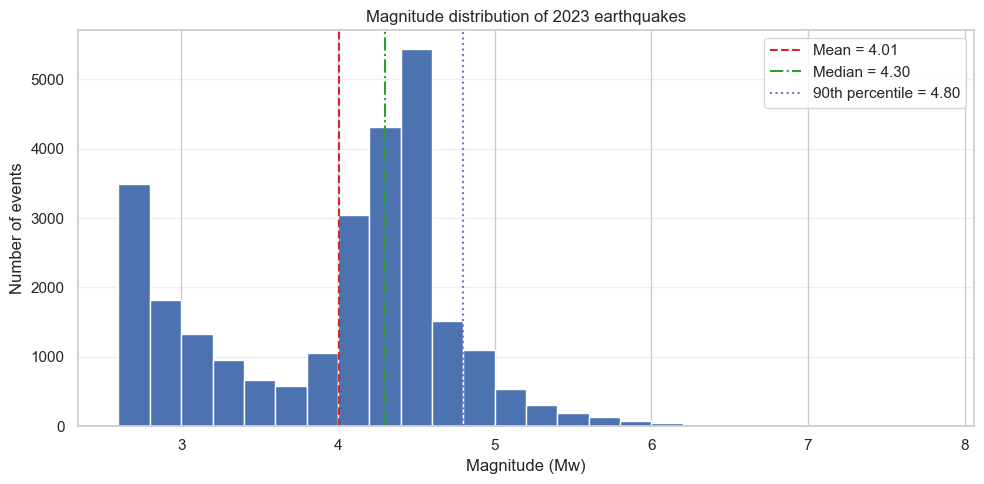

In [8]:
from earthquakelibs import libs

pd = libs.pd
np = libs.np
plt = libs.plt

# --- magnitude distribution ---
df_mag = globals().get('cleaned_eq_df', globals().get('eq_df'))
mag_series = df_mag['mag'].dropna()

mag_min = max(0, mag_series.min())
mag_max = mag_series.max()
bin_width = 0.2
bins = np.arange(mag_min, mag_max + bin_width, bin_width)

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(mag_series, bins=bins)

mag_mean = mag_series.mean()
mag_median = mag_series.median()
mag_q90 = np.percentile(mag_series, 90)

ax.axvline(mag_mean, color='tab:red', linestyle='--', linewidth=1.5, label=f'Mean = {mag_mean:.2f}')
ax.axvline(mag_median, color='tab:green', linestyle='-.', linewidth=1.5, label=f'Median = {mag_median:.2f}')
ax.axvline(mag_q90, color='tab:purple', linestyle=':', linewidth=1.5, label=f'90th percentile = {mag_q90:.2f}')

ax.set_xlabel('Magnitude (Mw)')
ax.set_ylabel('Number of events')
ax.set_title('Magnitude distribution of 2023 earthquakes')
ax.legend(loc='upper right')
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


**Figure 1. Magnitude distribution (2023 USGS, cleaned N=24,432).** Figure 1 shows the histogram of event magnitudes in the cleaned 2023 catalogue. It highlights the heavy right tail (rare large events) that motivates an imbalanced-classification approach for Mw ≥ 6.0.

**2.3.6: Global magnitude distribution**

It quantifies the rarity of strong events in the 2023 catalogue, informing expected class imbalance.

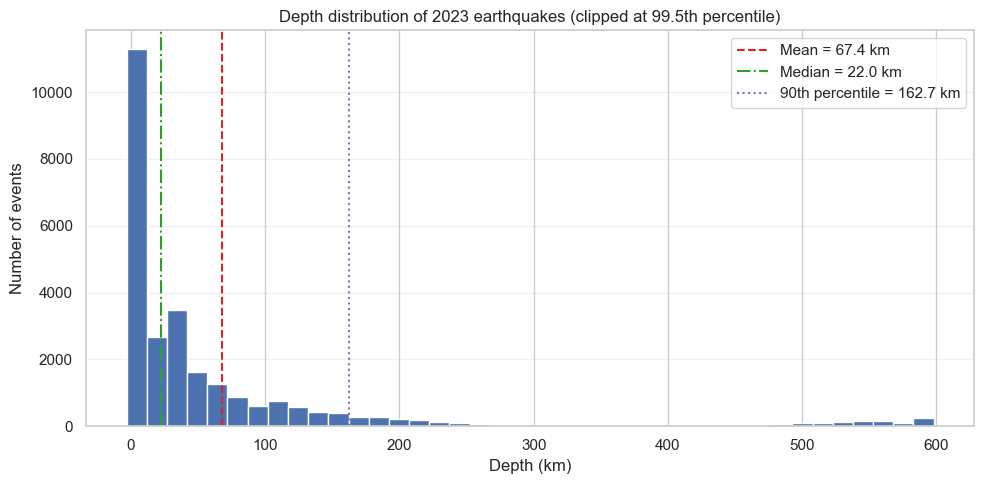

In [9]:
from earthquakelibs import libs

pd = libs.pd
np = libs.np
plt = libs.plt

# --- depth distribution ---
df_depth = globals().get('cleaned_eq_df', globals().get('eq_df'))
depth_series = df_depth['depth'].dropna()

depth_clip = np.percentile(depth_series, 99.5)
depth_plot = depth_series.clip(upper=depth_clip)

fig, ax = plt.subplots(figsize=(10, 5))
bins = 40
ax.hist(depth_plot, bins=bins)

depth_mean = depth_plot.mean()
depth_median = depth_plot.median()
depth_q90 = np.percentile(depth_plot, 90)

ax.axvline(depth_mean, color='tab:red', linestyle='--', linewidth=1.5, label=f'Mean = {depth_mean:.1f} km')
ax.axvline(depth_median, color='tab:green', linestyle='-.', linewidth=1.5, label=f'Median = {depth_median:.1f} km')
ax.axvline(depth_q90, color='tab:purple', linestyle=':', linewidth=1.5, label=f'90th percentile = {depth_q90:.1f} km')

ax.set_xlabel('Depth (km)')
ax.set_ylabel('Number of events')
ax.set_title('Depth distribution of 2023 earthquakes (clipped at 99.5th percentile)')
ax.legend(loc='upper right')
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


**Figure 2. Depth distribution (2023 USGS, cleaned N=24,432).** Figure 2 shows the distribution of focal depth (km), clipped at the 99.5th percentile for readability. The dominance of shallow events indicates that most 2023 seismicity occurs within the upper lithosphere.

**2.3.7: Global depth distribution**

It summarises focal depth ranges after initial filtering to validate the retained distribution.

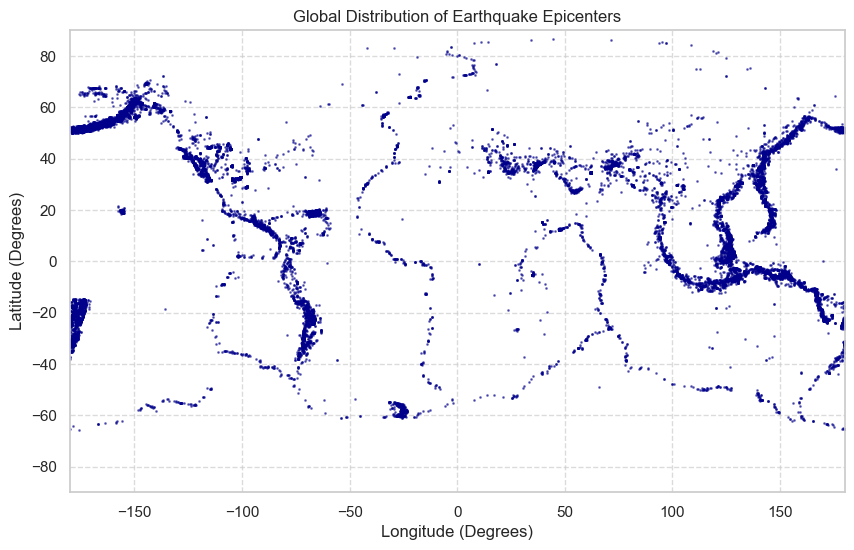

In [10]:


libs.plt.figure(figsize=(10, 6))
libs.plt.scatter(eq_df['longitude'], eq_df['latitude'], s=1, alpha=0.5, c='darkblue')

libs.plt.xlim(-180, 180)
libs.plt.ylim(-90, 90)

libs.plt.title('Global Distribution of Earthquake Epicenters')
libs.plt.xlabel('Longitude (Degrees)')
libs.plt.ylabel('Latitude (Degrees)')
libs.plt.grid(True, linestyle='--', alpha=0.7)


SAVE_SCATTER = False
if SAVE_SCATTER and OUTPUTS_DIR is not None:
    OUTPUTS_DIR.mkdir(exist_ok=True)
    libs.plt.savefig(OUTPUTS_DIR / "epicentre_scatter.png")

libs.plt.show()
libs.plt.close()


# Scatter epicentres globally to verify coordinate bounds, confirm coverage, and highlight
# tectonic belts such as the Pacific Ring before analysing event labels.



**Figure 3. Global epicentre distribution (2023 USGS, cleaned N=24,432).** Figure 3 shows epicentres plotted globally, revealing strong spatial clustering. This clustering aligns with major tectonic plate boundaries, supporting the plate-driven discussion of global seismicity patterns.

**2.3.8: Global spatial scatter sanity check**

It visualises global epicentres to confirm coordinate validity and broad geographic coverage.

Plot renders in the cell above when executed.

Visualisation to show all records falling between the longitude and latitude ranges.

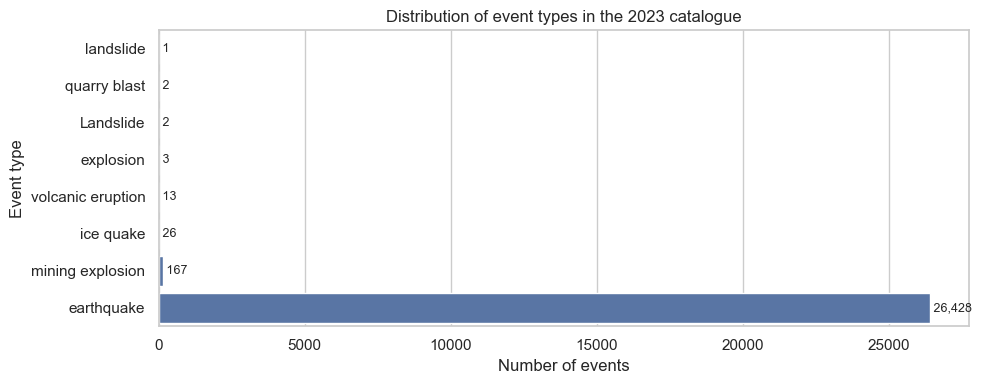

In [11]:
from earthquakelibs import libs

pd = libs.pd
plt = libs.plt
sns = libs.sns

# --- distribution of event types ---
type_counts = (
    eq_df['type']
    .value_counts(dropna=False)
    .sort_values(ascending=True)
)

n_types = len(type_counts)
fig_height = max(4, 0.4 * n_types)
fig, ax = plt.subplots(figsize=(10, fig_height))

sns.barplot(
    y=type_counts.index,
    x=type_counts.values,
    orient='h',
    ax=ax,
)

ax.set_xlabel('Number of events')
ax.set_ylabel('Event type')
ax.set_title('Distribution of event types in the 2023 catalogue')

for i, count in enumerate(type_counts.values):
    ax.text(
        count,
        i,
        f' {count:,}',
        va='center',
        ha='left',
        fontsize=9,
    )

plt.tight_layout()
plt.show()


**Figure 4. Event-type distribution (2023 USGS, raw N=26,642).** Figure 4 shows the distribution of reported event types in the USGS export. It motivates filtering to earthquakes only so subsequent analysis reflects tectonic seismicity rather than non-earthquake phenomena.

**2.3.9: Event type distribution**

It confirms that true earthquakes dominate the catalogue and quantifies the remaining event types.

The dataset predominantly holds data for earthquakes globally.

---

## 3. Cleaning Pipeline

Reliable analysis begins with a dataset that is complete, consistent and physically meaningful.

The cleaning pipeline used in this project consists of the following key steps:

**1. Work on a copy of the data**

A fresh copy of the dataset is created to protect the original raw data.

**2. Remove exact duplicate records**

Fully duplicated rows are dropped to avoid inflating earthquake counts.

**3. Remove duplicate earthquake identifiers, keeping only the most recent update**

The `id` field uniquely identifies each earthquake.

**4. Convert time fields into proper datetime format**

`time` and `updated` are parsed to datetimes so temporal grouping and ordering work reliably.

**5. Ensure core numeric fields are numeric and remove missing essential values**

`latitude`, `longitude`, `depth`, and `mag` are coerced to numeric values.

**6. Apply geophysical validity checks**

- Latitude within 90 degrees.

**7. Keep only real earthquakes (remove explosions and other event types)**

Non-earthquake labels (explosions, quarry blasts, etc.) are filtered out to focus on natural seismicity.

Non-essential fields such as `gap`, `dmin`, `nst`, `horizontalError`, `magError`, and `place` may be missing but.

In [12]:


def clean_data(df):
    """Clean the raw earthquake DataFrame: deduplicate records, coerce key fields,
    enforce physical bounds, and drop non earthquake event types. Returns a copy
    ready for downstream feature engineering."""
    df = df.copy()
    original_rows = len(df)

    # Drop exact duplicate rows first to get a stable baseline for all subsequent filters.
    df = df.drop_duplicates()
    print(f"Removed {original_rows - len(df)} exact duplicate rows.")

    # Parse timestamps; invalid strings become NaT so date filters and sorting stay reliable.
    df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)
    df["updated"] = pd.to_datetime(df["updated"], errors="coerce", utc=True)

    # If multiple records share an earthquake ID, keep the most recently updated record.
    rows_before_id_clean = len(df)
    df = (
        df.sort_values("updated")
        .drop_duplicates(subset="id", keep="last")
    )
    print(f"Removed {rows_before_id_clean - len(df)} rows with duplicate earthquake based on IDs.")

    # Standardise numeric fields so physical filters behave predictably.
    for col in ["latitude", "longitude", "depth", "mag"]:
        df[col] = pd.to_numeric(df[col], errors="coerce")

    # Remove rows missing essential fields needed for downstream analysis.
    essential_cols = ["time", "latitude", "longitude", "depth", "mag"]
    rows_before_essential_clean = len(df)
    df = df.dropna(subset=essential_cols)
    print(f"Removed {rows_before_essential_clean - len(df)} rows with missing essential earthquake information in {essential_cols}.")

    rows_before_ranges = len(df)

    # Enforce physically plausible latitude/longitude/depth/magnitude ranges.
    valid_lat = df["latitude"].between(-90, 90)
    valid_lon = df["longitude"].between(-180, 180)
    # Depths beyond ~700 km are exceedingly rare; trimming deeper values removes likely sensor errors.
    valid_depth = df["depth"].between(0, 700)
    valid_mag = df["mag"].between(0, 10)

    df = df[valid_lat & valid_lon & valid_depth & valid_mag]
    print(f"Removed {rows_before_ranges - len(df)} rows with invalid geographical ranges.")

    if 'type' in df.columns:
        # Keep only earthquake events, dropping blasts/quarry events and other non earthquake records.
        rows_before_type_clean = len(df)
        df = df[df["type"] == "earthquake"]
        print(f"Removed {rows_before_type_clean - len(df)} non earthquake events.")

    return df


# Cleaning pipeline: operate on a copy, remove exact duplicates, coerce timestamps, keep the most
# recent record per earthquake ID, convert key numerics, drop rows missing essentials, enforce
# geographic and magnitude bounds, and retain only rows labeled as earthquakes to form a reliable
# base table.


The `()` helper implements this policy-driven pipeline: it copies the dataframe, removes exact duplicates and older.

**Table 3. Class balance after cleaning (strong defined as Mw ≥ 6.0).** Table 3 shows the cleaned-record count and the strong-event count (146; 0.6%). This extreme imbalance motivates class weighting, threshold tuning, and precision–recall evaluation.

In [13]:
print('Raw dataset shape:', eq_df.shape)

cleaned_eq_df = clean_data(eq_df)

print('Cleaned dataset shape:', cleaned_eq_df.shape)
cleaned_eq_df.info()
preview_table(cleaned_eq_df)

strong_mask = cleaned_eq_df.get('is_strong_quake', cleaned_eq_df['mag'] >= 6.0)
strong_count = int(strong_mask.sum())
class_summary = pd.DataFrame({
    'Cleaned Records': [len(cleaned_eq_df)],
    'Strong Quakes (>=6.0)': [strong_count],
})
class_summary['Percentage Strong'] = (class_summary['Strong Quakes (>=6.0)'] / class_summary['Cleaned Records'] * 100).round(2)
print('\nClass balance after cleaning:')
display(class_summary)


Raw dataset shape: (26642, 22)
Removed 1960 exact duplicate rows.
Removed 0 rows with duplicate earthquake based on IDs.
Removed 0 rows with missing essential earthquake information in ['time', 'latitude', 'longitude', 'depth', 'mag'].
Removed 43 rows with invalid geographical ranges.
Removed 207 non earthquake events.
Cleaned dataset shape: (24432, 22)
<class 'pandas.core.frame.DataFrame'>
Index: 24432 entries, 19 to 18434
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             24432 non-null  datetime64[ns, UTC]
 1   latitude         24432 non-null  float64            
 2   longitude        24432 non-null  float64            
 3   depth            24432 non-null  float64            
 4   mag              24432 non-null  float64            
 5   magType          24432 non-null  object             
 6   nst              23051 non-null  float64            
 7   gap         

,Cleaned Records,Strong Quakes (>=6.0),Percentage Strong
0,24432,146,0.6


**3.1: Cleaning impact and class balance**

It reports how many records remain after validation and how the prevalence of strong events changes.

Cleaning impact on the 2023 catalogue: - Raw rows: 26,642; exact duplicates removed: 1,960.

These counts confirm that cleaning is conservative (most data retained) while removing implausible records.

---

## 4. Feature Engineering

The cleaned 2023 USGS earthquake dataset (``) contains valid latitude/longitude, non-negative depths, and realistic magnitudes.

Clean data is not automatically analytically useful.

Implementation guardrails: - Leakage guard: use `` and `` for EDA, but drop magnitude-derived fields and `` from modelling.

Feature engineering systematically transforms raw measurements into higher-level variables useful to humans and algorithms.

All transformations live in `engineer_features()`.

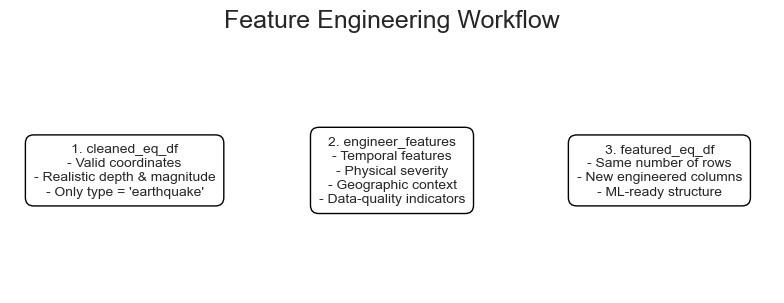

In [14]:
plt = libs.plt

fig, ax = plt.subplots(figsize=(8, 3.2))
ax.axis("off")

def box(x, n, text):
    ax.text(
        x, 0.5, f"{n}. {text}",
        ha="center", va="center",
        fontsize=10,
        bbox=dict(boxstyle="round,pad=0.6", fc="white", ec="black"),
    )

box(0.15, 1,
    "cleaned_eq_df\n"
    "- Valid coordinates\n"
    "- Realistic depth & magnitude\n"
    "- Only type = 'earthquake'")
box(0.50, 2,
    "engineer_features\n"
    "- Temporal features\n"
    "- Physical severity\n"
    "- Geographic context\n"
    "- Data-quality indicators")
box(0.85, 3,
    "featured_eq_df\n"
    "- Same number of rows\n"
    "- New engineered columns\n"
    "- ML-ready structure")

plt.title("Feature Engineering Workflow", fontsize=18, pad=15)
plt.tight_layout()
plt.show()


# Flow sketch linking `cleaned_eq_df` into `engineer_features` and out to `featured_eq_df`,
# clarifying the transition to feature creation.



**Figure 5. Feature engineering workflow (2023 USGS, cleaned N=24,432).** Figure 5 shows a schematic of the preprocessing and feature engineering pipeline. It clarifies how temporal, spatial, and data-quality features are derived prior to exploratory analysis and modelling.

The flow diagram below shows the lineage from the raw CSV through `()` to `()`, producing `` that powers.

*Figure: cleaned catalogue -> single `()` pass -> enriched `` (same rows, richer columns: temporal, physical, spatial, quality).

### 4.1 Design of the `engineer_features()` Function

Principles: 1) Domain interpretability - features reflect seismology concepts (depth classes, magnitude labels, tectonic regions).

#### 4.1.1 Temporal Features - When Earthquakes Occur

- `year`, `month`, `month_name` - `day`, `day_of_week`, `day_name` - `hour`, `part_of_day` (night/morning/afternoon/evening) - `is_weekend` - `season`

#### 4.1.2 Physical Severity Features - How Strong or Deep

- ``: shallow (0-70 km), intermediate (70-300 km), deep (300–700 km) - ``: minor, light, moderate, strong,.

Depth bins follow the standard shallow/intermediate/deep convention.

#### 4.1.3 Geographical Context Features - Where Earthquakes Occur

- `abs_latitude`, `abs_longitude` - `distance_from_equator_km`, `distance_from_prime_meridian_km` - `hemisphere_NS`, `hemisphere_EW` - `broad_region`: Americas, Europe-Africa, Asia-Pacific, Oceania

`` is a coarse tectonic grouping to reveal global patterns; a finer distance-to-plate-boundary feature.

#### 4.1.4 Data-Quality Features - How Reliable the Measurements Are

- Boolean indicators (e.g., `has_depthError`) - Min-max normalization of uncertainties - Composite `quality_score` (1 = highest quality)

`` is an unweighted mean of normalized uncertainties; if some uncertainties matter more, use a weighted average.

#### 4.1.5 Categorical Encodings

- Convenience ordinal codes `*_code` for categorical features.

Categorical codes (`*`) are convenience ordinals; for ML, one-hot or embed them, and scale continuous features.

In [15]:


import numpy as np
import pandas as pd
from pandas.api.types import is_datetime64_any_dtype, CategoricalDtype

def engineer_features(df: "pd.DataFrame") -> "pd.DataFrame":
    """Engineer temporal, physical, geographical, and data-quality features from the cleaned earthquake dataframe."""
    df = df.copy()


    if not is_datetime64_any_dtype(df["time"]):
        df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)

    dt = df["time"].dt
    df["time_str"] = dt.strftime("%Y-%m-%d %H:%M:%S")
    df["year"] = dt.year
    df["month"] = dt.month
    df["month_name"] = dt.month_name()
    df["day"] = dt.day
    df["day_of_week"] = dt.dayofweek
    df["day_name"] = dt.day_name()
    df["hour"] = dt.hour
    df["is_weekend"] = df["day_of_week"].isin([5, 6])

    def hour_to_part(h):
        if h < 6:   return "night"
        if h < 12:  return "morning"
        if h < 18:  return "afternoon"
        return "evening"
    df["part_of_day"] = df["hour"].apply(hour_to_part)

    def month_to_season(m):
        if m in (12, 1, 2):  return "winter"
        if m in (3, 4, 5):   return "spring"
        if m in (6, 7, 8):   return "summer"
        return "autumn"
    df["season"] = df["month"].apply(month_to_season)


    depth_cat_type = CategoricalDtype(categories=["shallow", "intermediate", "deep"], ordered=True)
    mag_cat_type = CategoricalDtype(categories=["minor", "light", "moderate", "strong", "major", "great", "massive"], ordered=True)
    df["depth_category"] = pd.cut(
        df["depth"],
        bins=[0, 70, 300, 700],
        labels=depth_cat_type.categories,
        right=False
    ).astype(depth_cat_type)
    df["mag_category"] = pd.cut(
        df["mag"],
        bins=[0, 3, 4, 5, 6, 7, 8, 10],
        labels=mag_cat_type.categories,
        right=False
    ).astype(mag_cat_type)
    df["is_strong_quake"] = df["mag"] >= 6.0
    df["energy_log10_J"] = 1.5 * df["mag"] + 4.8


    df["abs_latitude"] = df["latitude"].abs()
    df["abs_longitude"] = df["longitude"].abs()
    df["distance_from_equator_km"] = df["abs_latitude"] * 111.0
    df["distance_from_prime_meridian_km"] = (
        df["abs_longitude"] * 111.0 * np.cos(np.deg2rad(df["latitude"]))
    )
    df["hemisphere_NS"] = np.where(df["latitude"] >= 0, "north", "south")
    df["hemisphere_EW"] = np.where(df["longitude"] >= 0, "east", "west")

    def classify_region(lon):
        if lon < -100: return "Americas_west"
        if lon < -30:  return "Americas_east_Atlantic"
        if lon < 60:   return "Europe_Africa"
        if lon < 150:  return "Asia_WestPacific"
        return "Pacific_Oceania"
    df["broad_region"] = df["longitude"].apply(classify_region)


    for col in ["depthError", "magError", "horizontalError"]:
        if col in df.columns:
            df[f"has_{col}"] = df[col].notna()

    norm_cols = []
    for col in ["gap", "rms", "depthError", "magError", "horizontalError"]:
        if col in df.columns:
            mn, mx = df[col].min(), df[col].max()
            if pd.notna(mn) and pd.notna(mx) and mn != mx:
                norm_name = f"{col}_norm"
                df[norm_name] = (df[col] - mn) / (mx - mn)
                norm_cols.append(norm_name)
    if norm_cols:
        df["quality_score"] = 1 - df[norm_cols].mean(axis=1)


    category_types = {
        "depth_category": depth_cat_type,
        "mag_category": mag_cat_type,
        "hemisphere_NS": CategoricalDtype(categories=["north", "south"]),
        "hemisphere_EW": CategoricalDtype(categories=["east", "west"]),
        "broad_region": CategoricalDtype(categories=["Americas_west", "Americas_east_Atlantic", "Europe_Africa", "Asia_WestPacific", "Pacific_Oceania"]),
        "part_of_day": CategoricalDtype(categories=["night", "morning", "afternoon", "evening"], ordered=True),
        "season": CategoricalDtype(categories=["winter", "spring", "summer", "autumn"], ordered=True),
    }
    for col, cat_type in category_types.items():
        if col in df.columns:
            df[col] = df[col].astype(cat_type)

    for c in category_types:
        if c in df.columns and hasattr(df[c], "cat"):
            cat_series = df[c]
            if "unknown" not in cat_series.cat.categories:
                cat_series = cat_series.cat.add_categories(["unknown"])
            df[c] = cat_series
            df[f"{c}_code"] = cat_series.fillna("unknown").cat.codes

    return df


# Feature engineering steps: add temporal fields (year, month, season, part of day), physical
# severity (depth and magnitude categories, energy proxy, strong flag), geographic context
# (hemispheres, coarse region, distances to equator and prime meridian), data-quality signals
# (error presence, normalized scores, composite quality), and categorical encodings for modelling.


The next cell defines `()`, which adds temporal, physical, spatial, and quality features plus encoded variants for.

### 4.2 Engineered Feature Schema Summary

In [16]:

featured_eq_df = engineer_features(cleaned_eq_df)


try:
    featured_eq_df
except NameError:
    raise NameError(
        "The variable 'featured_eq_df' is not defined.\n"
        "Run the feature-engineering step first:\n"
        "    featured_eq_df = engineer_features(cleaned_eq_df)"
    )

schema_groups = {
    "Temporal": ["year", "month", "season", "part_of_day", "is_weekend"],
    "Physical": ["depth_category", "mag_category", "is_strong_quake", "energy_log10_J"],
    "Spatial": ["hemisphere_NS", "hemisphere_EW", "broad_region", "distance_from_equator_km"],
    "Quality": ["quality_score", "gap_norm", "rms_norm", "has_depthError"],
    "ML Encodings": ["depth_category_code", "mag_category_code", "season_code", "part_of_day_code"],
}

print("Engineered Feature Schema Summary\n(showing only columns present in featured_eq_df)\n")

total_listed = set()
for group_name, columns in schema_groups.items():
    existing = [col for col in columns if col in featured_eq_df.columns]
    total_listed.update(existing)
    print(f"{group_name} ({len(existing)} features):")
    for col in existing:
        print(f"  - {col}")
    print()

print(f"Total engineered features listed: {len(total_listed)}")


# Inventory engineered features by theme, listing those present so downstream plots and models
# know which signals are available.



Engineered Feature Schema Summary
(showing only columns present in featured_eq_df)

Temporal (5 features):
  - year
  - month
  - season
  - part_of_day
  - is_weekend

Physical (4 features):
  - depth_category
  - mag_category
  - is_strong_quake
  - energy_log10_J

Spatial (4 features):
  - hemisphere_NS
  - hemisphere_EW
  - broad_region
  - distance_from_equator_km

Quality (4 features):
  - quality_score
  - gap_norm
  - rms_norm
  - has_depthError

ML Encodings (4 features):
  - depth_category_code
  - mag_category_code
  - season_code
  - part_of_day_code

Total engineered features listed: 21


**4.2.1: Engineered feature inventory**

It enumerates engineered features by theme for transparency and reproducibility.

The schema summary above provides a structured overview of all engineered features added to the cleaned.

The temporal group confirms that the original timestamp has been decomposed into interpretable components such as.

The final group, ML Encodings, contains the integer representations of categorical variables that are required for.

Overall, this schema demonstrates how the feature-engineering pipeline lifts the raw USGS catalogue into a.

### 4.3 Feature Engineering Pipeline

**Table 4. Engineered dataset preview (feature-enriched schema; N=24,432).** Table 4 shows the final feature-engineered dataset used for modelling (60 columns). It demonstrates the added temporal, spatial, and quality features that extend the original USGS fields.

In [17]:


print("Applying feature engineering to cleaned_eq_df...")


original_columns = list(cleaned_eq_df.columns)


featured_eq_df = engineer_features(cleaned_eq_df)


print("=== Dataset Shape Comparison ===")
print(f"Before feature engineering : {cleaned_eq_df.shape}")
print(f"After feature engineering  : {featured_eq_df.shape}")


new_cols = [c for c in featured_eq_df.columns if c not in original_columns]

print(f"Number of engineered features added: {len(new_cols)}")
print("Sample of engineered feature names (first 20):")
for c in sorted(new_cols)[:20]:
    print(f"  - {c}")


print("Preview of engineered dataframe:")
preview_table(featured_eq_df)


# Run the feature pipeline on the cleaned dataset; compare shapes before/after, count newly added
# columns, sample their names, and preview rows to confirm readiness for Section 5 (EDA) and Section 6 (modelling) analyses.



Applying feature engineering to cleaned_eq_df...
=== Dataset Shape Comparison ===
Before feature engineering : (24432, 22)
After feature engineering  : (24432, 60)
Number of engineered features added: 38
Sample of engineered feature names (first 20):
  - abs_latitude
  - abs_longitude
  - broad_region
  - broad_region_code
  - day
  - day_name
  - day_of_week
  - depthError_norm
  - depth_category
  - depth_category_code
  - distance_from_equator_km
  - distance_from_prime_meridian_km
  - energy_log10_J
  - gap_norm
  - has_depthError
  - has_horizontalError
  - has_magError
  - hemisphere_EW
  - hemisphere_EW_code
  - hemisphere_NS
Preview of engineered dataframe:


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,magError norm,horizontalError norm,quality score,depth category code,mag category code,hemisphere NS code,hemisphere EW code,broad region code,part of day code,season code
19,2023-01-01 09:04:40.710000+00:00,17.830333,-65.985500,10.92,2.78,md,8.0,245.0,0.177300,0.14,...,0.028210,0.008788,0.837641,0,0,0,1,1,1,0
22,2023-01-01 10:09:37.830000+00:00,18.206500,-67.117333,21.88,2.95,md,26.0,97.0,0.005188,0.13,...,0.041231,0.002727,0.924656,0,0,0,1,1,1,0
53,2023-01-01 23:56:53.930000+00:00,19.360100,-65.725600,34.00,3.62,md,14.0,270.0,1.110400,0.44,...,0.017817,0.036768,0.703399,0,1,0,1,1,3,0
65,2023-01-02 04:15:00.130000+00:00,17.947833,-66.908500,12.69,2.80,md,22.0,192.0,0.038830,0.13,...,0.021568,0.003434,0.873287,0,0,0,1,1,0,0
79,2023-01-02 06:56:51.300000+00:00,17.946333,-67.008500,10.55,2.88,md,5.0,230.0,0.113300,0.17,...,0.023183,0.012828,0.842688,0,0,0,1,1,1,0


After running the pipeline, the notebook prints shapes, column counts, and a head of ``, confirming the.

The output above confirms that the feature engineering function has been applied successfully to the cleaned.

The increase in the number of columns reflects the addition of new engineered features across the.

The preview of `` reveals the final structure of the enriched dataset, allowing us to verify that.

Overall, the pipeline output demonstrates that the dataset is now fully prepared for exploratory analysis (Section.

### 4.4 Overview of Engineered Feature Groups

To validate that the engineered features behave sensibly and to provide an at-a-glance summary.

Together, these visualisations provide a compact diagnostic view of the engineered feature space, confirming that the.

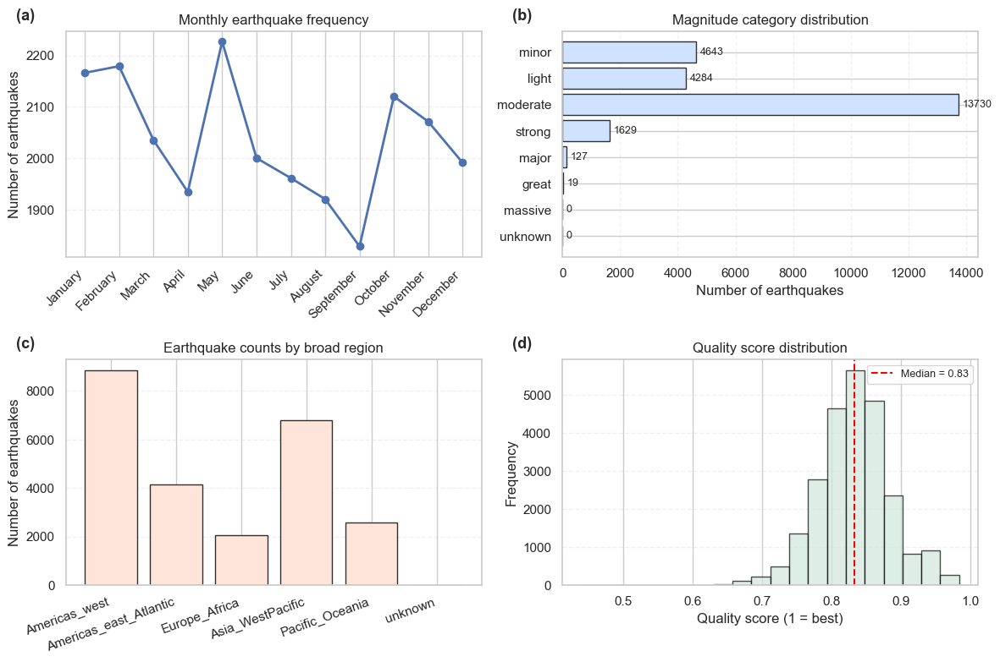

In [18]:

plt = libs.plt
np = libs.np

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.ravel()
labels = ['(a)', '(b)', '(c)', '(d)']


order_months = [
    "January","February","March","April","May","June",
    "July","August","September","October","November","December"
]
month_counts = (
    featured_eq_df["month_name"]
    .value_counts()
    .reindex(order_months)
    .fillna(0)
)
x = np.arange(len(order_months))
axes[0].plot(x, month_counts.values, marker="o", linewidth=2)
axes[0].set_title("Monthly earthquake frequency", fontsize=12)
axes[0].set_xticks(x)
axes[0].set_xticklabels(order_months, rotation=45, ha="right")
axes[0].set_ylabel("Number of earthquakes")
axes[0].grid(axis="y", linestyle="--", alpha=0.3)
axes[0].text(-0.12, 1.05, labels[0], transform=axes[0].transAxes,
             fontsize=13, fontweight="bold")


mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)
y_pos = np.arange(len(mag_counts))
axes[1].barh(y_pos, mag_counts.values, color="#cfe2ff", edgecolor="#2f2f2f")
axes[1].set_yticks(y_pos)
axes[1].set_yticklabels(mag_counts.index.astype(str))
axes[1].invert_yaxis()
axes[1].set_title("Magnitude category distribution", fontsize=12)
axes[1].set_xlabel("Number of earthquakes")
axes[1].grid(axis="x", linestyle="--", alpha=0.3)
axes[1].text(-0.12, 1.05, labels[1], transform=axes[1].transAxes,
             fontsize=13, fontweight="bold")
for i, v in enumerate(mag_counts.values):
    axes[1].text(v + mag_counts.values.max()*0.01, i, str(v),
                 va="center", fontsize=9)


region_counts = (
    featured_eq_df["broad_region"]
    .value_counts()
    .sort_index()
)
x2 = np.arange(len(region_counts))
axes[2].bar(x2, region_counts.values, color="#ffe5d9", edgecolor="#2f2f2f")
axes[2].set_xticks(x2)
axes[2].set_xticklabels(region_counts.index.astype(str), rotation=20, ha="right")
axes[2].set_title("Earthquake counts by broad region", fontsize=12)
axes[2].set_ylabel("Number of earthquakes")
axes[2].grid(axis="y", linestyle="--", alpha=0.3)
axes[2].text(-0.12, 1.05, labels[2], transform=axes[2].transAxes,
             fontsize=13, fontweight="bold")


ax = axes[3]
if "quality_score" in featured_eq_df.columns:
    qs = featured_eq_df["quality_score"].dropna()
    ax.hist(qs, bins=20, edgecolor="black", alpha=0.7, color="#d1e7dd")
    median_qs = qs.median()
    ax.axvline(median_qs, color="red", linestyle="--", linewidth=1.5,
               label=f"Median = {median_qs:.2f}")
    ax.set_title("Quality score distribution", fontsize=12)
    ax.set_xlabel("Quality score (1 = best)")
    ax.set_ylabel("Frequency")
    ax.grid(axis="y", linestyle="--", alpha=0.3)
    ax.legend(fontsize=9)
else:
    ax.text(0.5, 0.5, "quality_score not available",
            ha="center", va="center", fontsize=11)
    ax.axis("off")
ax.text(-0.12, 1.05, labels[3], transform=ax.transAxes,
        fontsize=13, fontweight="bold")

plt.tight_layout()
plt.show()


# Four-panel overview: (a) monthly seasonality, (b) magnitude category distribution, (c) counts by
# broad region, and (d) data-quality distribution. Provides a dashboard snapshot before deeper
# dimension-specific analysis.



**Figure 6. Engineered feature groups overview (2023 USGS, cleaned N=24,432).** Figure 6 shows an overview of engineered variables grouped by temporal, magnitude/depth, regional, and measurement-quality features. The figure highlights the breadth of explanatory signals used for both discussion and classification.

**4.4.1: Feature summary dashboard**

It presents a compact dashboard of seasonality, magnitude mix, regional counts, and quality distributions.

**Panel (a)** shows that global seismic activity in 2023 is distributed relatively evenly across the calendar.

**Panel (b)** illustrates the dominance of the lower magnitude classes (minor-moderate) and the rarity of.

**Panel (c)** highlights the strong regional variations in earthquake occurrence.

**Panel (d)** summarises the distribution of the composite ``, showing that most events have mid-to-high.

Together, these panels confirm that the engineered features behave logically, preserve known seismological patterns, and are.

### 4.5 Additional Feature Level Visualisations

To complement the high-level overview in Figure 4.4, the following visuals examine individual engineered features in more detail.

#### 4.5.1 Magnitude severity profile

Figure 4.5 presents the distribution of the engineered `` variable using a horizontal bar layout.

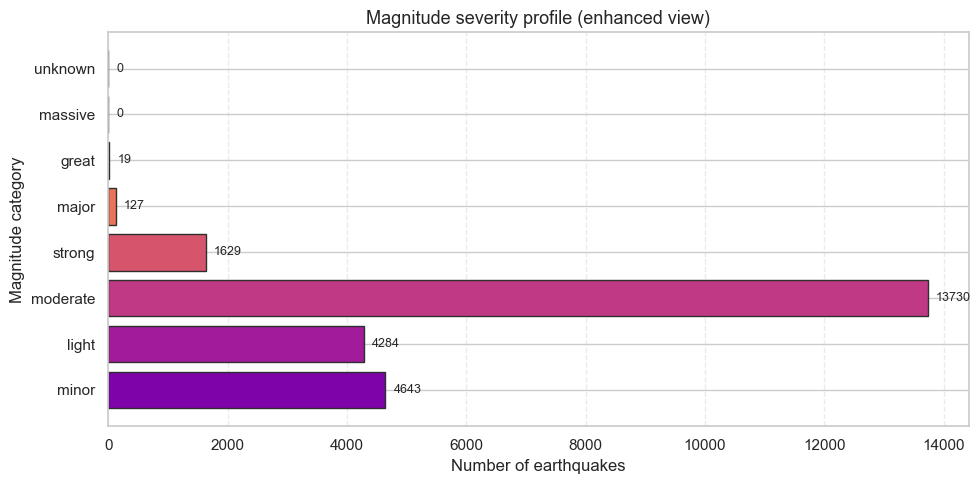

In [19]:

plt = libs.plt
np = libs.np

mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)

colors = plt.cm.plasma(np.linspace(0.25, 0.95, len(mag_counts)))

plt.figure(figsize=(10, 5))
plt.barh(
    mag_counts.index.astype(str),
    mag_counts.values,
    color=colors,
    edgecolor="#2f2f2f"
)

plt.title("Magnitude severity profile (enhanced view)", fontsize=13)
plt.xlabel("Number of earthquakes")
plt.ylabel("Magnitude category")
plt.grid(axis="x", linestyle="--", alpha=0.4)


for i, v in enumerate(mag_counts.values):
    plt.text(
        v + max(mag_counts.values) * 0.01,
        i,
        str(v),
        va="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()


# Magnitude severity profile: horizontal view of counts per seismological category to
# contextualise subsequent depth and regional comparisons.



**Figure 7. Magnitude severity profile (2023 USGS, cleaned N=24,432).** Figure 7 shows magnitude categories and their relative frequency. It emphasises the rarity of strong events under the Mw ≥ 6.0 definition, which drives threshold selection and evaluation via precision–recall.

The magnitude severity profile below highlights the steep drop-off from minor and light events to.

The plot reveals a clear ordered risk gradient: the bulk of events fall into the minor.

#### 4.5.2 Magnitude distribution by depth category

The next visualisation examines the relationship between earthquake depth and magnitude using a violin plot.

**4.5.2.1: Magnitude distribution by depth category**

Violin plots reveal that shallow events dominate and show a broader spread of magnitudes, while intermediate.

**4.5.2.1: Magnitude distribution by depth category**

It compares magnitude distributions across depth classes to clarify how severity varies with depth.

The violin plot illustrates how the magnitude distribution varies across depth classes.

The width and tails of each violin demonstrate how the likelihood of different magnitudes changes with.

#### 4.5.3 Global epicentre distribution with magnitude-depth

The final visualisation integrates the engineered spatial and physical-severity features to provide a single global view.

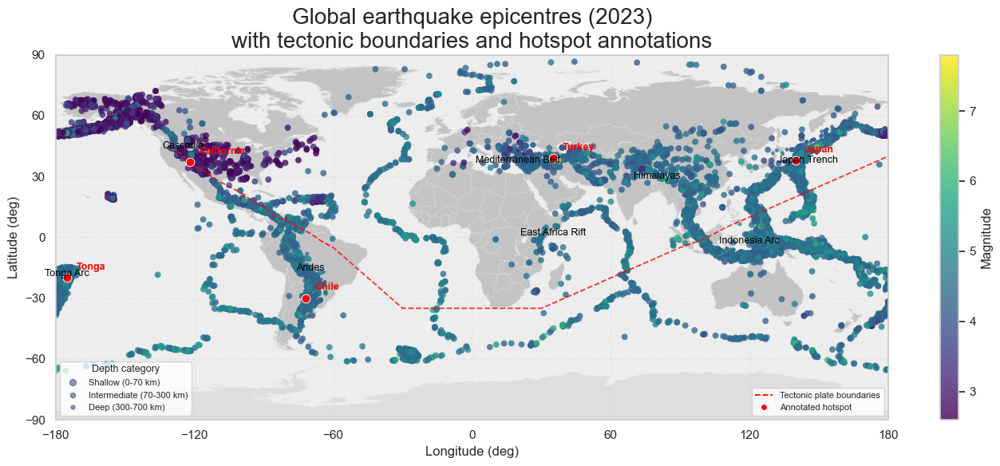

In [20]:

plt = libs.plt
mpimg = libs.mpimg
np = libs.np
pd = libs.pd
Line2D = libs.Line2D

map_path = WORLD_MAP_FILE
plates_path = PLATE_FILE

cropped_img = None
if mpimg is not None and map_path is not None and map_path.exists():
    try:
        img = mpimg.imread(map_path)
        rgb = img[:, :, :3]
        brightness = rgb.mean(axis=2)
        mask = brightness > 0.02
        if mask.any():
            rows = np.where(mask.any(axis=1))[0]
            cols = np.where(mask.any(axis=0))[0]
            cropped_img = np.clip(img[rows[0]:rows[-1], cols[0]:cols[-1]] * 0.9, 0, 1)
    except Exception as exc:
        print(f"Skipping background image: {exc}")
else:
    print("World map image not found; drawing map without a background image.")

plates = None
if plates_path is not None and plates_path.exists():
    try:
        plates = pd.read_csv(plates_path)
    except Exception as exc:
        print(f"Skipping plate boundary overlay: {exc}")
else:
    print("Plate boundary file not found; continuing without boundary overlay.")

size_map = {"shallow": 32, "intermediate": 20, "deep": 12}
marker_sizes = (
    featured_eq_df["depth_category"]
    .map(size_map)
    .astype(float)
    .fillna(14.0)
)

fig, ax = plt.subplots(figsize=(14, 6))

if cropped_img is not None:
    ax.imshow(
        cropped_img,
        extent=[-180, 180, -90, 90],
        aspect="auto",
        alpha=0.75,
        zorder=0,
    )

sc = ax.scatter(
    featured_eq_df["longitude"],
    featured_eq_df["latitude"],
    c=featured_eq_df["mag"],
    s=marker_sizes,
    alpha=0.8,
    cmap="viridis",
    edgecolors="none",
    zorder=2,
)

if plates is not None:
    ax.plot(
        plates["lon"], plates["lat"],
        color="red", linewidth=1.3, linestyle="--",
        alpha=0.8, zorder=3,
    )

hotspots = {
    "Japan": (140, 38),
    "Chile": (-72, -30),
    "Turkey": (35, 39),
    "Tonga": (-175, -20),
    "California": (-122, 37),
}

for name, (x, y) in hotspots.items():
    ax.scatter(x, y, s=60, c="red", edgecolors="white", linewidth=0.7, zorder=4)
    ax.text(
        x + 4, y + 4,
        name,
        fontsize=9,
        color="red",
        fontweight="bold",
        zorder=5,
    )

tectonic_labels = {
    "Andes": (-70, -15),
    "Cascadia": (-125, 45),
    "Mediterranean Belt": (20, 38),
    "Himalayas": (80, 30),
    "East Africa Rift": (35, 2),
    "Indonesia Arc": (120, -2),
    "Japan Trench": (145, 38),
    "Tonga Arc": (-175, -18),
}

for name, (lon, lat) in tectonic_labels.items():
    ax.text(
        lon, lat, name,
        fontsize=9, color="black",
        ha="center", va="center",
        alpha=1, zorder=4,
    )

ax.set_title(
    "Global earthquake epicentres (2023)\nwith tectonic boundaries and hotspot annotations",
    fontsize=20,
)
ax.set_xlabel("Longitude (deg)")
ax.set_ylabel("Latitude (deg)")
ax.set_xlim(-180, 180)
ax.set_ylim(-90, 90)
ax.set_xticks(np.arange(-180, 181, 60))
ax.set_yticks(np.arange(-90, 91, 30))
ax.grid(True, linestyle="--", alpha=0.25)

cbar = plt.colorbar(sc, ax=ax)
cbar.set_label("Magnitude")

depth_legend_elements = [
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["shallow"]),
           label='Shallow (0-70 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["intermediate"]),
           label='Intermediate (70-300 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["deep"]),
           label='Deep (300-700 km)', markerfacecolor='grey', alpha=0.8),
]

depth_legend = ax.legend(
    handles=depth_legend_elements,
    title="Depth category",
    loc="lower left",
    fontsize=8,
    title_fontsize=9,
    frameon=True,
)
ax.add_artist(depth_legend)

boundary_hotspot_legend = ax.legend(
    handles=[
        Line2D([0], [0], color="red", linestyle="--", linewidth=1.3, label="Tectonic plate boundaries"),
        Line2D([0], [0], marker="o", linestyle="", markersize=6,
               markerfacecolor="red", markeredgecolor="white", label="Annotated hotspot"),
    ],
    loc="lower right",
    fontsize=8,
    frameon=True,
)

plt.tight_layout()
plt.show()

# World map composite: load optional background and plate-boundary overlays when available,
# crop and dim the map for clarity, overlay epicentres sized by depth bucket and colored by
# magnitude, annotate hotspots and tectonic provinces, and include legends for depth and
# boundary layers while remaining resilient if assets are missing.


**Figure 8. Epicentres with tectonic boundaries (2023 USGS, cleaned N=24,432).** Figure 8 shows earthquake epicentres overlaid with plate boundaries and hotspot annotations. The tight co-location between epicentres and boundaries provides visual evidence for plate-margin concentration of seismicity.

### 4.6 Summary and Reflection

The feature-engineering stage transformed the cleaned earthquake catalogue into a structured, analysis-ready dataset that.

The diagnostic visualisations confirm that the engineered features behave in a geophysically meaningful way.

From an analytical perspective, the engineered dataset offers a substantially richer basis for downstream exploration and.

A key strength of the approach is its reproducibility: because `()` is implemented as a modular function,.

---

## 5. Exploratory Data Analysis

This section summarises global spatial patterns (maps, magnitude/depth histograms) and multivariate or regional relationships (magnitude/.

**5.1: Global tectonic context map**

It overlays magnitude and depth cues on plate boundaries to provide tectonic context for subsequent regional analyses.

### 5.1 Global Patterns

Discussion of global epicentre distributions, highlighting plate-boundary clustering, depth distributions, and magnitude patterns observed in.

In [21]:

print("Library availability (inline helper):")
print(libs.availability())


# Dependency status printout indicating which optional libraries are available to choose between
# interactive Plotly outputs and static matplotlib/seaborn fallbacks.



Library availability (inline helper):
{'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


**5.1.1: EDA dependency status**

It reports the availability of optional EDA and export libraries used in this section.

**5.1.2: Magnitude density by depth category (KDE)**

Kernel density curves for shallow, intermediate, and deep events highlight subtle shifts in severity: shallow events.

**5.1.2: Magnitude density by depth category (KDE)**

It compares magnitude-density profiles across shallow, intermediate, and deep events.

**5.1.3: Depth distribution sanity check**

Histogram and box plots show a strongly right-skewed depth distribution: most earthquakes occur in the.

**5.1.3: Depth distribution sanity check**

This section diagnoses depth spread, outliers, and validate 0–700 km bounds.

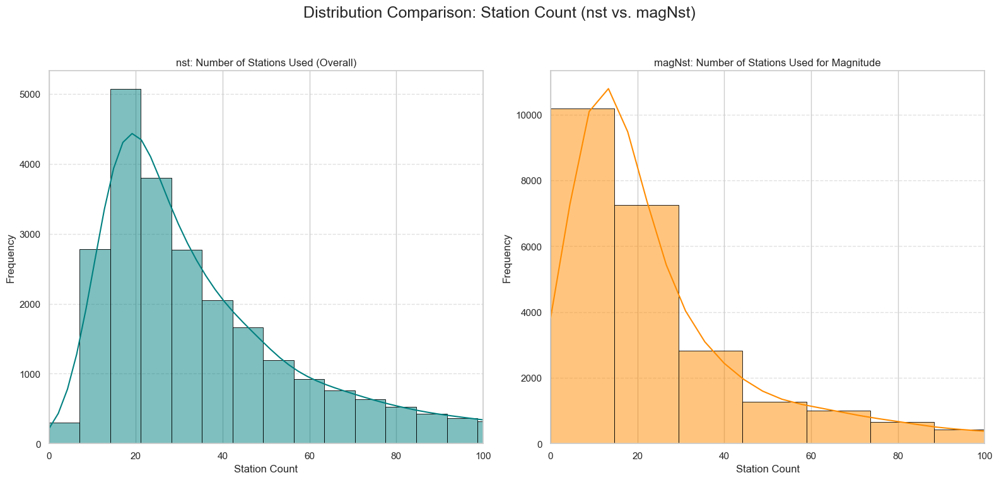

In [22]:



nst_data = eq_df['nst'].dropna()
magNst_data = eq_df['magNst'].dropna()

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Distribution Comparison: Station Count (nst vs. magNst)', fontsize=18)

max_limit = 100
bins_count = 60

sns.histplot(nst_data, bins=bins_count, ax=axes[0], color='teal', edgecolor='black', kde=True)
axes[0].set_title('nst: Number of Stations Used (Overall)')
axes[0].set_xlabel('Station Count')
axes[0].set_ylabel('Frequency')
axes[0].set_xlim(0, max_limit)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

sns.histplot(magNst_data, bins=bins_count, ax=axes[1], color='darkorange', edgecolor='black', kde=True)
axes[1].set_title('magNst: Number of Stations Used for Magnitude')
axes[1].set_xlabel('Station Count')
axes[1].set_ylabel('Frequency')
axes[1].set_xlim(0, max_limit)
axes[1].grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Station coverage check: compare `nst` (location stations) against `magNst` (magnitude stations)
# to assess network support and identify long tails linked to measurement quality.



**Figure 9. Station-coverage diagnostics (2023 USGS, cleaned N=24,432).** Figure 9 shows distributions of station metrics (e.g., nst and magNst). It matters because coverage affects uncertainty: sparse station geometry typically yields less reliable event parameters.

**5.1.4: Station count distributions**

It assesses station support for location and magnitude measurements.

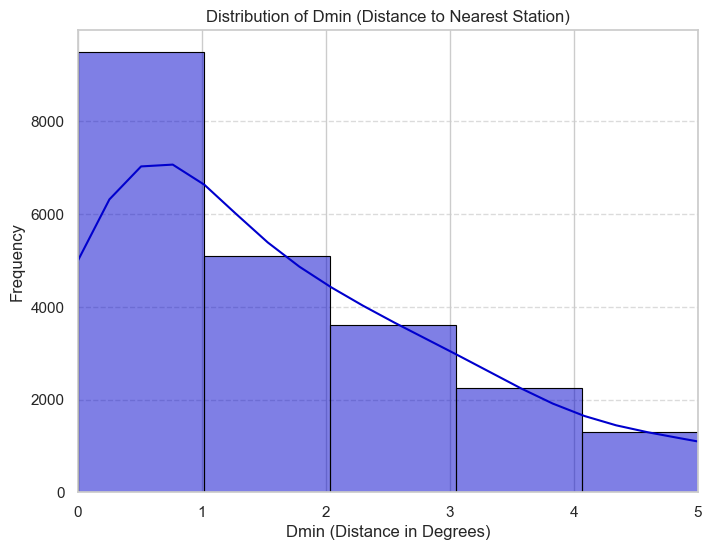

In [23]:



dmin_data = eq_df['dmin'].dropna()

plt = libs.plt
sns = libs.sns

plt.figure(figsize=(8, 6))

sns.histplot(dmin_data, bins=50, color='mediumblue', edgecolor='black', kde=True)

plt.xlim(0, 5)

plt.title('Distribution of Dmin (Distance to Nearest Station)')
plt.xlabel('Dmin (Distance in Degrees)')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Nearest-station distance (`dmin`) distribution with histogram and KDE to understand sensor
# proximity and potential impact on measurement reliability.



**Figure 10. Nearest-station distance (2023 USGS, cleaned N=24,432).** Figure 10 shows the distribution of dmin (distance to the nearest station). It provides context for measurement geometry, which is later reflected in uncertainty and quality features.

**5.1.5: Nearest station distance distribution**

It profiles nearest-station distances as a proxy for observational coverage and uncertainty.

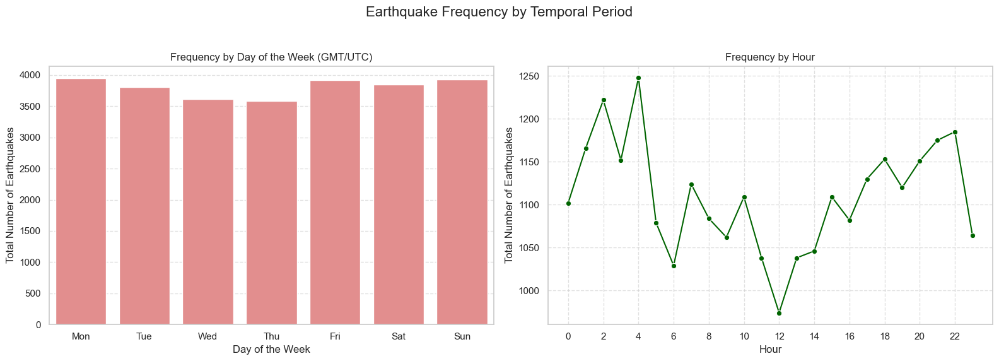

In [24]:



eq_df['time'] = pd.to_datetime(eq_df['time'])
eq_df['day_of_week'] = eq_df['time'].dt.dayofweek
eq_df['hour_of_day'] = eq_df['time'].dt.hour

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Earthquake Frequency by Temporal Period', fontsize=16)

day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
day_counts = eq_df['day_of_week'].value_counts().sort_index()

sns.barplot(x=day_counts.index, y=day_counts.values, ax=axes[0], color='lightcoral')
axes[0].set_title('Frequency by Day of the Week (GMT/UTC)')
axes[0].set_xlabel('Day of the Week')
axes[0].set_ylabel('Total Number of Earthquakes')
axes[0].set_xticks(range(7))
axes[0].set_xticklabels(day_labels)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

hour_counts = eq_df['hour_of_day'].value_counts().sort_index()
all_hours = pd.Series(0, index=range(24)).add(hour_counts, fill_value=0)

sns.lineplot(x=all_hours.index, y=all_hours.values, ax=axes[1], marker='o', color='darkgreen')
axes[1].set_title('Frequency by Hour')
axes[1].set_xlabel('Hour')
axes[1].set_ylabel('Total Number of Earthquakes')
axes[1].set_xticks(range(0, 24, 2))
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Temporal frequency: counts by weekday and hour (UTC) to reveal logging patterns before linking
# time signals to physical characteristics.



**Figure 11. Temporal reporting patterns (2023 USGS, cleaned N=24,432).** Figure 11 shows counts by weekday and hour-of-day. Any mild periodicity is interpreted as operational reporting/detection structure rather than a true geophysical weekly cycle.

**5.1.6: Temporal event frequency (weekday and hour)**

It summarises event counts by weekday and hour (UTC) to characterise temporal sampling.

### 5.2 Multivariate & Regional

#### 5.2.1 Inter-feature correlation

This heatmap visually summarizes the linear relationships between all continuous, numerical features.

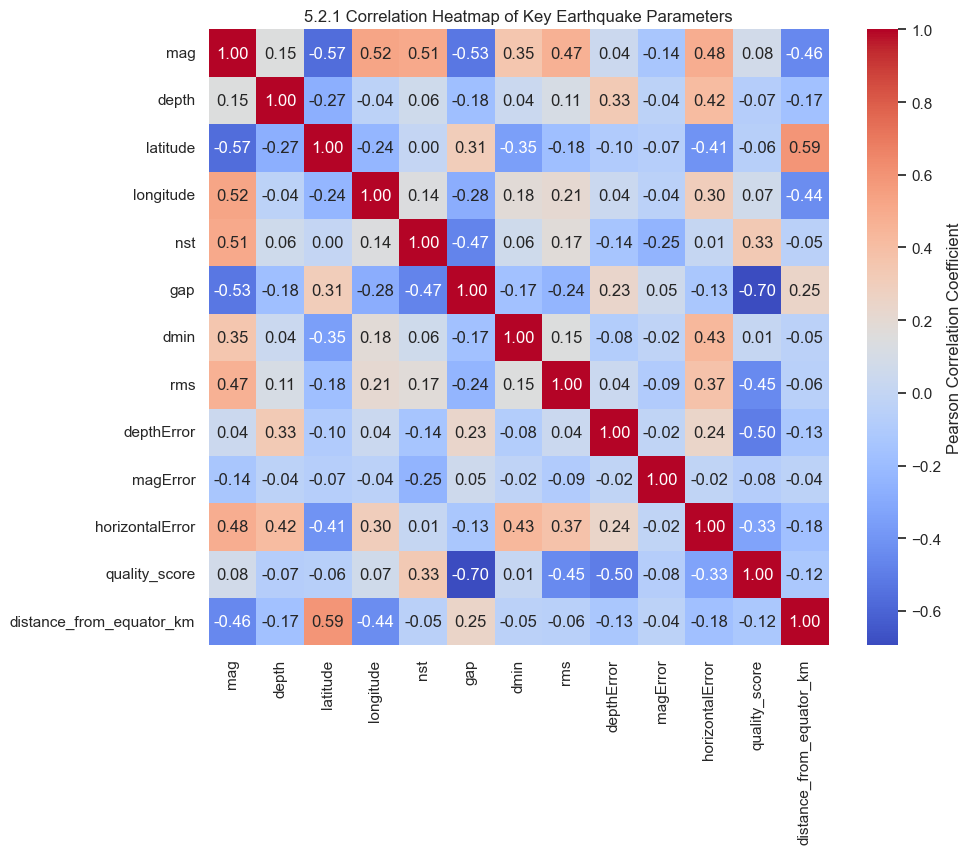

In [25]:
pd = libs.pd
plt = libs.plt
sns = libs.sns

df = globals().get('featured_eq_df', globals().get('eq_df'))

correlation_features = [
    'mag',
    'depth',
    'latitude',
    'longitude',
    'nst',             
    'gap',             
    'dmin',           
    'rms',             
    'depthError',      
    'magError',
    'horizontalError',
    'quality_score',   
    'distance_from_equator_km' # Engineered feature
]

present_features = [f for f in correlation_features if f in df.columns]

corr_matrix = df[present_features].corr()

plt.figure(figsize=(10, 8))

sns.heatmap(
    corr_matrix,
    annot=True,          
    fmt=".2f",           
    cmap='coolwarm',     
    cbar_kws={'label': 'Pearson Correlation Coefficient'}
)

plt.title('5.2.1 Correlation Heatmap of Key Earthquake Parameters')
plt.show()

#get is safety net to make sure notebook is more flexible.  Looks in 2 different places to ensure there is no crash if all cells are not running.
#1st - df with extra engineered features 2nd(fallback) - original df 
#variable list of all corellation features
#List comprehension that loops through every corellation_feature - cleaner than a standard for loop
#Correlation matrix created
#Creates heat map with annotations, formatting, colour and labels with appropriate title

**Figure 12. Correlation heatmap (2023 USGS, cleaned N=24,432).** Figure 12 shows correlations among selected numeric variables. It helps identify expected dependencies (e.g., between uncertainty metrics) and supports model design by checking for strong collinearity.

The correlation heatmap quantifies the relationships between all continuous parameters.

#### 5.2.2 Magnitude vs Depth

Deep-focus earthquakes produce different shaking profiles from shallow crustal events.

,events,events_pct,median_mag,pct_strong
depth_bin,,,,
"(-0.001, 50.0]",16798,68.8,4.2,0.5
"(50.0, 100.0]",3092,12.7,4.3,0.5
"(100.0, 200.0]",2702,11.1,4.3,0.7
"(200.0, 400.0]",783,3.2,4.3,1.4
"(400.0, 700.0]",1057,4.3,4.3,1.2


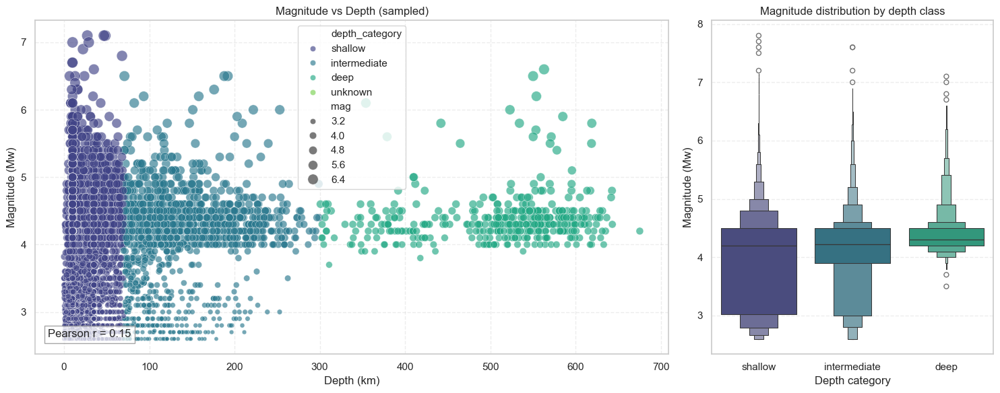

In [26]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

depth_mag_df = featured_eq_df[["depth", "mag", "depth_category", "mag_category"]].dropna(subset=["depth", "mag"]).copy()
if depth_mag_df.empty:
    raise ValueError("No depth/magnitude samples available for Section 5.2.1.")

sample_limit = 8000
plot_df = depth_mag_df.sample(sample_limit, random_state=42) if len(depth_mag_df) > sample_limit else depth_mag_df
corr_value = float(depth_mag_df["mag"].corr(depth_mag_df["depth"]))
depth_mag_df["depth_bin"] = pd.cut(
    depth_mag_df["depth"],
    bins=[0, 50, 100, 200, 400, 700],
    include_lowest=True,
    duplicates="drop"
)

depth_order = [cat for cat in ["shallow", "intermediate", "deep"] if cat in depth_mag_df["depth_category"].dropna().unique()]
depth_order = depth_order if depth_order else None
fig, axes = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={"width_ratios": [2.25, 1]})
sns.scatterplot(
    data=plot_df,
    x="depth",
    y="mag",
    hue="depth_category",
    size="mag",
    sizes=(20, 140),
    palette="viridis",
    alpha=0.65,
    ax=axes[0]
)
axes[0].set_title("Magnitude vs Depth (sampled)")
axes[0].set_xlabel("Depth (km)")
axes[0].set_ylabel("Magnitude (Mw)")
axes[0].grid(True, linestyle="--", alpha=0.35)
axes[0].text(
    0.02,
    0.05,
    f"Pearson r = {corr_value:.2f}",
    transform=axes[0].transAxes,
    bbox={"facecolor": "white", "alpha": 0.7, "edgecolor": "gray"}
)

sns.boxenplot(
    data=depth_mag_df,
    x="depth_category",
    y="mag",
    hue="depth_category",
    order=depth_order,
    palette="viridis",
    dodge=False,
    ax=axes[1]
)
legend = axes[1].get_legend()
if legend is not None:
    legend.remove()
axes[1].set_title("Magnitude distribution by depth class")
axes[1].set_xlabel("Depth category")
axes[1].set_ylabel("Magnitude (Mw)")
axes[1].grid(True, axis="y", linestyle="--", alpha=0.35)

plt.tight_layout()

depth_summary = (
    depth_mag_df.dropna(subset=["depth_bin"])
    .groupby("depth_bin", observed=False)
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        pct_strong=("mag", lambda s: 100 * (s >= 6.0).mean())
    )
)
depth_summary["events_pct"] = depth_summary["events"] / len(depth_mag_df) * 100
depth_summary = depth_summary[["events", "events_pct", "median_mag", "pct_strong"]]
depth_summary = depth_summary.round({"events": 0, "events_pct": 1, "median_mag": 2, "pct_strong": 1})
depth_summary


# depth-magnitude relationship: sampled scatter colored by depth class and sized by magnitude,
# boxen plots per depth category, Pearson correlation, and tabulated counts/medians/strong quake
# rates per depth bin to set up regional and mapping cuts.



**Figure 13. Magnitude vs depth (2023 USGS, cleaned N=24,432).** Figure 13 shows a sampled magnitude–depth scatter and magnitude distributions by depth class. The weak correlation ($r\approx0.15$) indicates limited linear coupling, while strong events occur across depth regimes.

The scatter, boxen plots, correlation statistic, and depth-bin summary quantify how magnitude varies with depth.

- **Correlation panel** - Pearson `r` quantifies coupling between depth and magnitude; |r| above ~0.3 suggests physical.

#### 5.2.3 Global Spatial Distribution (Epicentre Map)

An interactive Plotly globe (with a Matplotlib fallback) shows epicentres scaled by magnitude, while the accompanying.

- Run the code cell below to render the interactive map inline (or Matplotlib fallback if Plotly.

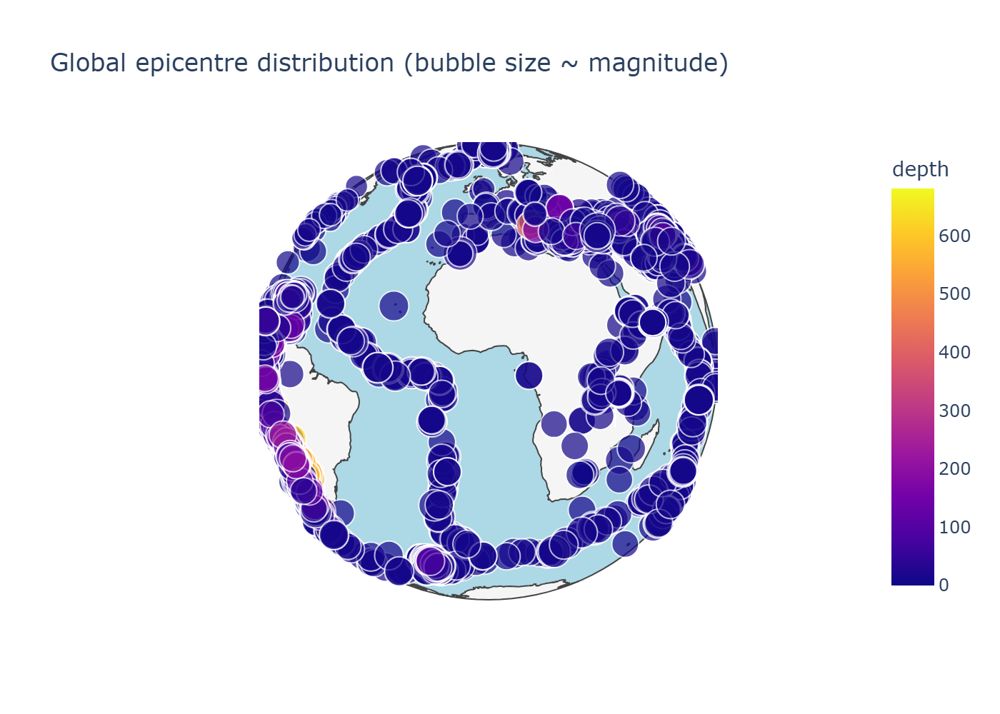

In [27]:

import sys, subprocess
from pandas.api.types import is_datetime64_any_dtype
from IPython.display import HTML, Image, display

px = libs.px
plt = libs.plt
pd = libs.pd
np = libs.np

map_df = featured_eq_df.copy()
if "time" in map_df.columns:
    time_col = map_df["time"]
    if not is_datetime64_any_dtype(time_col):
        time_col = pd.to_datetime(time_col, errors="coerce", utc=True)
    map_df["time_str"] = time_col.dt.strftime("%Y-%m-%d %H:%M:%S")

map_cols = ["latitude", "longitude", "mag", "mag_category", "broad_region", "depth", "place", "time_str"]
available_cols = [c for c in map_cols if c in map_df.columns]
map_df = map_df[available_cols].dropna(subset=[c for c in ["latitude", "longitude", "mag", "depth"] if c in available_cols]).copy()
if map_df.empty:
    raise ValueError("No latitude/longitude samples available for Section 5.2.2.")

map_df["place"] = map_df["place"].fillna("Unknown location")
map_df["mag_size"] = np.clip(map_df["mag"], 3, None)
map_df["is_strong"] = map_df["mag"] >= 6.0
map_df["hover_label"] = (
    map_df["place"]
    + " | Mw " + map_df["mag"].round(1).astype(str)
    + " | depth " + map_df["depth"].round(0).astype(int).astype(str) + " km"
 )

fig = None
if px is not None:
    import plotly.io as pio
    pio.renderers.default = "notebook_connected"
    fig = px.scatter_geo(
        map_df,
        lat="latitude",
        lon="longitude",
        color="depth",
        size="mag_size",
        size_max=18,
        hover_name="place",
        hover_data={"mag":":.1f", "depth":":.0f", "mag_category":True, "broad_region":True, "time_str":True},
        projection="orthographic",
        template="plotly_white",
        title="Global epicentre distribution (bubble size ~ magnitude)",
    )
    fig.update_layout(legend_title_text="Broad region")
    fig.update_geos(showocean=True, oceancolor="lightblue", showland=True, landcolor="whitesmoke")
    html = fig.to_html(full_html=False, include_plotlyjs="embed")
    display(HTML(html))
else:
    fig, ax = plt.subplots(figsize=(14, 7))
    scatter = ax.scatter(
        map_df["longitude"],
        map_df["latitude"],
        c=map_df["mag"],
        cmap="plasma",
        s=np.square(map_df["mag_size"]) * 1.5,
        alpha=0.6,
        linewidths=0.15,
        edgecolor="black",
    )
    ax.set_title("Global epicentre distribution (bubble size ~ magnitude)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-180, 180)
    ax.set_ylim(-90, 90)
    ax.grid(True, linestyle="--", alpha=0.3)
    plt.colorbar(scatter, ax=ax, label="Magnitude (Mw)")

region_summary = (
    map_df.assign(strong_pct=map_df["is_strong"].astype(float))
    .groupby("broad_region")
    .agg(
        events=("mag", "size"),
        pct_global=("mag", lambda s: 100 * len(s) / len(map_df)),
        pct_strong=("strong_pct", "mean"),
        median_depth=("depth", "median"),
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_strong"] = region_summary["pct_strong"] * 100
region_summary = region_summary.round({"events": 0, "pct_global": 1, "pct_strong": 1, "median_depth": 0})
region_summary

export_epicentre_outputs = True
if export_epicentre_outputs:
    OUTPUTS_DIR.mkdir(parents=True, exist_ok=True)
    FIGURES_DIR = OUTPUTS_DIR / "figures"
    FIGURES_DIR.mkdir(parents=True, exist_ok=True)

    region_summary.to_csv(OUTPUTS_DIR / "region_summary_section5_2.csv")
    png_path = FIGURES_DIR / "epicentre_map_section5_2.png"
    if px is not None and fig is not None:
        fig.write_html(OUTPUTS_DIR / "epicentre_map_section5_2.html", include_plotlyjs="embed")
        need_kaleido = False
        try:
            import kaleido
        except ImportError:
            need_kaleido = True
        if need_kaleido:
            try:
                subprocess.check_call([sys.executable, "-m", "pip", "install", "kaleido"])
                import kaleido
            except Exception as exc:
                print(f"Kaleido install failed; skipping static export. ({exc})")
            else:
                need_kaleido = False
        if not need_kaleido:
            try:
                fig.write_image(png_path, scale=2)
            except Exception as exc:
                print(f"Plotly static export skipped: {exc}")
    elif fig is not None:
        fig.savefig(png_path, dpi=300, bbox_inches="tight")

    if png_path.exists():
        display(Image(filename=str(png_path)))

# Epicentre atlas with exports: global bubble map (Plotly globe if available, static fallback
# otherwise), rich hover labels including time strings to avoid Plotly datetime issues,
# per region summary (counts, share of global events, strong quake rate, median depth), and
# optional HTML/PNG/CSV exports for offline use.


**Figure 14. Plotly epicentre map with PNG fallback (2023 USGS, cleaned N=24,432).** Figure 14 shows an interactive global epicentre visualisation (Plotly) with magnitude and depth encoding. For PDF export robustness, the figure is also exported to a static PNG and displayed inline.

**5.2.3.1: Epicentre map and regional summary**

It maps global epicentres with magnitude cues and summarises regional statistics, exporting the supporting artefacts.

Run the Section 5.2.2 cell above to see the map output in-line.

- **Geospatial bubble map** - hover any bubble to retrieve location, magnitude, and depth.

#### 5.2.4 Regional Seismicity Comparisons

Quantify how the magnitude and depth mix differs by `broad_region`.

,events,median_mag,iqr_mag,pct_major,median_depth
broad_region,,,,,
Americas_west,8852,3.10,1.30,0.1,21.0
Asia_WestPacific,6797,4.40,0.40,0.1,35.0
Americas_east_Atlantic,4156,4.01,1.19,0.0,28.0
Pacific_Oceania,2566,4.40,0.50,0.2,35.0
Europe_Africa,2061,4.40,0.50,0.1,10.0
unknown,0,NaN,NaN,NaN,NaN


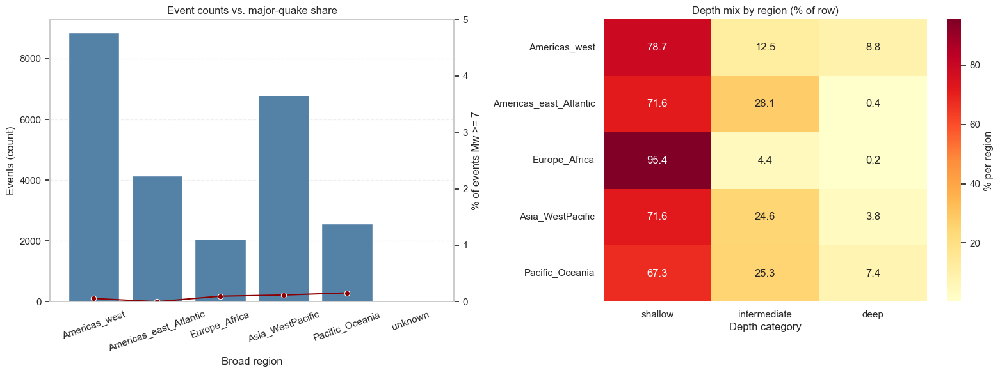

In [28]:

sns = libs.sns
pd = libs.pd
plt = libs.plt

region_cols = ["broad_region", "mag", "depth", "depth_category"]
region_cols = [c for c in region_cols if c in featured_eq_df.columns]
region_df = featured_eq_df[region_cols].dropna(subset=["broad_region", "mag"]).copy()
if region_df.empty:
    raise ValueError("No regional samples available for Section 5.2.3.")

region_df["is_major"] = region_df["mag"] >= 7.0

region_summary = (
    region_df.groupby("broad_region")
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        iqr_mag=("mag", lambda s: s.quantile(0.75) - s.quantile(0.25)),
        pct_major=("is_major", "mean"),
        median_depth=("depth", "median")
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_major"] = region_summary["pct_major"] * 100
region_plot = region_summary.reset_index()

depth_mix = pd.crosstab(region_df["broad_region"], region_df["depth_category"], normalize="index") * 100

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.barplot(data=region_plot, x="broad_region", y="events", color="steelblue", ax=axes[0])
axes[0].set_title("Event counts vs. major-quake share")
axes[0].set_xlabel("Broad region")
axes[0].set_ylabel("Events (count)")
axes[0].tick_params(axis="x", rotation=20)
axes[0].grid(True, axis="y", linestyle="--", alpha=0.3)

ax2 = axes[0].twinx()
sns.lineplot(data=region_plot, x="broad_region", y="pct_major", marker="o", color="darkred", ax=ax2)
ax2.set_ylabel("% of events Mw >= 7")
ax2.set_ylim(0, max(5, region_plot["pct_major"].max() + 2))
ax2.grid(False)

if depth_mix.empty:
    axes[1].text(0.5, 0.5, "Depth categories unavailable", ha="center", va="center", fontsize=12)
    axes[1].axis("off")
else:
    sns.heatmap(
        depth_mix,
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        cbar_kws={"label": "% per region"},
        ax=axes[1]
    )
    axes[1].set_title("Depth mix by region (% of row)")
    axes[1].set_xlabel("Depth category")
    axes[1].set_ylabel("")

plt.tight_layout()

region_summary = region_summary.round({"median_mag": 2, "iqr_mag": 2, "pct_major": 1, "median_depth": 0})
region_summary


# Regional severity dashboard: per region event counts, median and IQR magnitude, major-quake
# share, and median depth, combined with a depth-mix heatmap to show clustering and depth
# distribution before quality and modelling sections.



**Figure 15. Regional seismicity comparisons (2023 USGS, cleaned N=24,432).** Figure 15 shows regional contrasts in event counts and major-event share, alongside regional depth composition. It matters because regions differ not only in activity but also in depth regime and extreme-event propensity.

**5.2.4.1: Regional severity comparison**

It compares regions by event counts, magnitude statistics, major-quake share, and depth composition.

- **Volume vs.

#### 5.2.5 Quality Score & Uncertainty Analysis

`quality_score` compresses normalised gap/rms/error metrics into a 0-1 scale (1 = best).

(                        events  mean quality  p10 quality  p90 quality  \
 broad_region                                                             
 Europe Africa             2061         0.852        0.805        0.895   
 Asia WestPacific          6797         0.837        0.792        0.880   
 Americas west             8852         0.831        0.760        0.936   
 Americas east Atlantic    4156         0.824        0.748        0.885   
 Pacific Oceania           2566         0.823        0.769        0.873   
 unknown                      0           NaN          NaN          NaN   
 
                         median magError  median depthError  \
 broad_region                                                 
 Europe Africa                     0.110              1.919   
 Asia WestPacific                  0.113              4.751   
 Americas west                     0.115              2.000   
 Americas east Atlantic            0.100              3.742   
 Pacific Oceania    

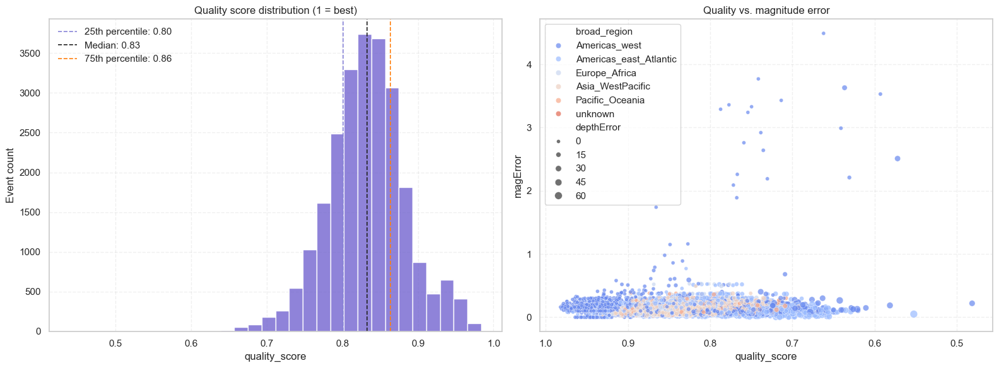

In [29]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

quality_base_cols = [
    "quality_score", "gap", "rms", "depthError", "magError", "horizontalError",
    "mag", "mag_category", "broad_region", "time", "place", "id"
]
quality_cols = [c for c in quality_base_cols if c in featured_eq_df.columns]
quality_df = featured_eq_df[quality_cols].dropna(subset=["quality_score"]).copy()
if quality_df.empty:
    raise ValueError("quality_score not available for Section 5.2.4.")

quantiles = quality_df["quality_score"].quantile([0.25, 0.5, 0.75]).to_dict()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.histplot(
    data=quality_df,
    x="quality_score",
    bins=30,
    color="slateblue",
    edgecolor="white",
    ax=axes[0]
)
axes[0].set_title("Quality score distribution (1 = best)")
axes[0].set_xlabel("Quality score")
axes[0].set_ylabel("Event count")
for quant, label, color in [
    (0.25, "25th percentile", "#8884d8"),
    (0.50, "Median", "#222222"),
    (0.75, "75th percentile", "#ff7f0e")
]:
    axes[0].axvline(quantiles[quant], color=color, linestyle="--", linewidth=1.2, label=f"{label}: {quantiles[quant]:.2f}")
axes[0].legend(loc="best", frameon=False)
axes[0].grid(True, linestyle="--", alpha=0.3)

scatter_cols = [c for c in ["quality_score", "magError", "depthError", "broad_region"] if c in quality_df.columns]
scatter_df = quality_df[scatter_cols].dropna()
axes[1].set_title("Quality vs. magnitude error")
axes[1].set_xlabel("Quality score")
axes[1].set_ylabel("magError")
if scatter_df.empty:
    axes[1].text(0.5, 0.5, "Missing error columns", ha="center", va="center", fontsize=12)
    axes[1].grid(False)
else:
    hue_col = "broad_region" if "broad_region" in scatter_df.columns else None
    size_col = "depthError" if "depthError" in scatter_df.columns else None
    sns.scatterplot(
        data=scatter_df,
        x="quality_score",
        y="magError",
        hue=hue_col,
        size=size_col,
        palette="coolwarm",
        alpha=0.7,
        ax=axes[1]
    )
    axes[1].grid(True, linestyle="--", alpha=0.3)
    axes[1].invert_xaxis()
    axes[1].legend(loc="best")

plt.tight_layout()

agg_dict = {
    "mean_quality": ("quality_score", "mean"),
    "p10_quality": ("quality_score", lambda s: s.quantile(0.10)),
    "p90_quality": ("quality_score", lambda s: s.quantile(0.90))
}
if "magError" in quality_df.columns:
    agg_dict["median_magError"] = ("magError", "median")
if "depthError" in quality_df.columns:
    agg_dict["median_depthError"] = ("depthError", "median")
if "horizontalError" in quality_df.columns:
    agg_dict["median_horizontalError"] = ("horizontalError", "median")

region_quality = quality_df.groupby("broad_region").agg(**agg_dict)
region_quality.insert(0, "events", quality_df.groupby("broad_region").size())
region_quality = region_quality.sort_values("mean_quality", ascending=False)
region_quality = region_quality.round(3)

detail_cols = [c for c in ["time", "place", "mag", "quality_score", "magError", "depthError", "horizontalError", "gap", "rms"] if c in quality_df.columns]
low_quality_events = quality_df.nsmallest(min(5, len(quality_df)), "quality_score")[detail_cols]


region_quality_display = region_quality.copy()
region_quality_display.index = region_quality_display.index.str.replace("_", " ")
region_quality_display.columns = [c.replace("_", " ") for c in region_quality_display.columns]

low_quality_display = low_quality_events.copy()
low_quality_display.columns = [c.replace("_", " ") for c in low_quality_display.columns]
low_quality_display = low_quality_display.rename_axis(None)

region_quality_display, low_quality_display


# Quality analysis: distribution of `quality_score` with quantile markers, scatter of quality
# versus magnitude error (colored by region, sized by depth error), regional aggregates, and a
# small set of lowest-quality events to close Section 5 with a reliability check.



**Figure 16. Quality score and uncertainty (2023 USGS, cleaned N=24,432).** Figure 16 shows the distribution of the composite quality score and its relationship to uncertainty measures. This supports the use of quality indicators as informative features and as context for interpreting results.

**5.2.5.1: Quality score and uncertainty analysis**

It examines the quality-score distribution, relates it to magnitude uncertainty, and aggregates results by region.

- **Histogram** - cite percentile markers to describe overall measurement fidelity; a tight cluster near 1 indicates robust.

---

## 6. Strong Quake Classification

This section turns the feature-engineered dataset into a supervised learning problem: predicting whether an event.

### 6.1 Data split, pipeline, and models

We assemble a modelling dataframe from ``, define numeric/categorical feature groups, and train two models: a.

Class imbalance is severe in this task: only about 0.6% of events in the featured.

In [30]:
import importlib, subprocess, sys

def ensure_section9_deps(verbose=True, install_missing=True):
    """Ensure the modelling section dependencies (matplotlib and scikit-learn) are available."""
    missing = []
    if libs.plt is None:
        missing.append("matplotlib")
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")

    if not missing:
        if verbose:
            print("Modelling dependencies ready:", libs.availability())
        return libs

    if not install_missing:
        if verbose:
            print("Missing modelling dependencies:", ", ".join(missing))
        return libs

    if verbose:
        print("Installing missing dependencies for Section 6:", ", ".join(missing))
    cmd = [sys.executable, "-m", "pip", "install", *missing]
    subprocess.check_call(cmd)
    import earthquakelibs as eq
    importlib.reload(eq)
    globals().update(
        libs=eq.libs,
        np=eq.libs.np,
        pd=eq.libs.pd,
        plt=eq.libs.plt,
        sns=eq.libs.sns,
        px=eq.libs.px,
        go=eq.libs.go,
    )
    if verbose:
        print("Modelling dependencies ready:", libs.availability())
    return libs

if not globals().get("_SECTION9_READY", False):
    ensure_section9_deps(verbose=True, install_missing=True)
    _SECTION9_READY = True


# Modelling preparation: verify matplotlib and scikit-learn availability (install if permitted),
# reload shared handles, and expose availability flags so the Section 6 classification runs
# without dependency failures.


Modelling dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


**6.1.1: Modelling dependency status**

It confirms which modelling and export dependencies are available in the current environment.

**6.1.2: Model training and metric summary**

Logistic regression and random forest baselines deliver comparable precision and recall profiles on the imbalanced test.

**6.1.2: Model training and metric summary**

It trains logistic regression and random forest baselines and reports key evaluation metrics and thresholds.

In [31]:
# Hold-out evaluation with threshold tuning, calibration metrics, and artifacts for plots.
from sklearn.metrics import brier_score_loss
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.metrics import confusion_matrix, classification_report

# If the hyperparameter sweep is skipped (e.g., executor skip), define safe defaults
# so downstream evaluation can still run end-to-end.
if "best_model_grid" not in globals():
    best_model_grid = {"model": "log_reg_elastic", "params": {"C": 1.0, "l1_ratio": 0.5}}

# Require engineered/cleaned dataframe
if "featured_eq_df" not in globals():
    raise NameError("featured_eq_df is missing. Run cleaning/feature engineering first.")

pd = libs.pd
model_df = featured_eq_df.copy()

target_col = "is_strong_quake"
if target_col not in model_df.columns:
    if "mag" in model_df.columns:
        model_df[target_col] = (model_df["mag"] >= 6.0)
    else:
        raise NameError("Cannot create target: neither is_strong_quake nor mag is available.")

# Prefer the curated feature lists if present, otherwise fall back to numeric-only.
leak_cols = {target_col, "mag", "mag_category", "energy_log10_J"}

have_feature_lists = ("numeric_features" in globals()) and ("categorical_features" in globals())
feature_cols = None

if have_feature_lists:
    candidate = [c for c in (numeric_features + categorical_features) if c in model_df.columns]
    candidate = [c for c in candidate if c not in leak_cols]
    if len(candidate) > 0:
        feature_cols = candidate

if feature_cols is None:
    numeric_only = model_df.select_dtypes(include=["number"]).columns.tolist()
    feature_cols = [c for c in numeric_only if c not in leak_cols]

if len(feature_cols) == 0:
    raise ValueError("No usable feature columns found for hold-out evaluation.")

# Build training base
_df = model_df[feature_cols + [target_col]].copy()
_df = _df.dropna(subset=[target_col])

X_base = _df[feature_cols]
y_base = _df[target_col].astype(int)

# Derive transformer column lists from the actual dataframe used for fitting
num_cols = [c for c in X_base.columns if pd.api.types.is_numeric_dtype(X_base[c])]
cat_cols = [c for c in X_base.columns if c not in num_cols]

def build_preprocess():
    cat = libs.Pipeline([
        ("imputer", libs.SimpleImputer(strategy="most_frequent")),
        ("encoder", libs.OneHotEncoder(handle_unknown="ignore")),
    ])
    num = libs.Pipeline([
        ("imputer", libs.SimpleImputer(strategy="median")),
        ("scaler", libs.StandardScaler()),
    ])
    return libs.ColumnTransformer([
        ("num", num, num_cols),
        ("cat", cat, cat_cols),
    ], remainder="drop")

if best_model_grid["model"] == "log_reg_elastic":
    def build_best():
        return libs.Pipeline([
            ("preprocess", build_preprocess()),
            ("clf", libs.LogisticRegression(
                penalty="elasticnet",
                solver="saga",
                l1_ratio=best_model_grid["params"].get("l1_ratio", 0.5),
                C=best_model_grid["params"].get("C", 1.0),
                class_weight="balanced",
                max_iter=800,
                n_jobs=-1,
            )),
        ])
else:
    def build_best():
        return libs.Pipeline([
            ("preprocess", build_preprocess()),
            ("clf", libs.RandomForestClassifier(
                class_weight="balanced",
                n_jobs=-1,
                random_state=42,
                **best_model_grid["params"],
            )),
        ])

X_train, X_test, y_train, y_test = libs.train_test_split(
    X_base, y_base, test_size=0.2, stratify=y_base, random_state=42
)

model_best = build_best()
if best_model_grid["model"] == "log_reg_elastic":
    model_best = CalibratedClassifierCV(estimator=model_best, cv=3, method="sigmoid")

model_best.fit(X_train, y_train)

y_prob = model_best.predict_proba(X_test)[:, 1]
precision, recall, thresholds = libs.precision_recall_curve(y_test, y_prob)
f1_scores = 2 * precision * recall / (precision + recall + 1e-9)
best_idx = f1_scores.argmax()
best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else 0.5

def threshold_for_recall(target=0.8):
    for p, r, t in zip(precision, recall, list(thresholds) + [1]):
        if r >= target:
            return t
    return thresholds[-1] if len(thresholds) else 0.5

recall_priority_threshold = threshold_for_recall(0.8)
y_pred_f1 = (y_prob >= best_threshold).astype(int)
y_pred_recall = (y_prob >= recall_priority_threshold).astype(int)

conf_mat = libs.confusion_matrix(y_test, y_pred_f1)
conf_mat_recall = libs.confusion_matrix(y_test, y_pred_recall)
roc_curve_vals = libs.roc_curve(y_test, y_prob)
pr_curve = (precision, recall, thresholds)
ap = libs.average_precision_score(y_test, y_prob)
f1_best = f1_scores[best_idx]
brier = brier_score_loss(y_test, y_prob)
prob_true, prob_pred = calibration_curve(y_test, y_prob, n_bins=10, strategy="quantile")

print(f"Hold-out ({best_model_grid['model']}) AP: {ap:.3f}, F1@best: {f1_best:.3f}, threshold: {best_threshold:.3f}, Brier: {brier:.3f}")
print("Confusion matrix (F1-optimal):", conf_mat)
print("Confusion matrix (recall-priority, ~0.8):", conf_mat_recall)
print(classification_report(y_test, y_pred_f1, target_names=["Not strong", "Strong"]))

thresholds_info = {
    "best_threshold": best_threshold,
    "recall_priority_threshold": recall_priority_threshold,
    "f1_best": f1_best,
    "ap": ap,
    "brier": brier,
}
reliability_curve = {"prob_true": prob_true, "prob_pred": prob_pred}

globals().update(
    conf_mat=conf_mat,
    roc_curve_vals=roc_curve_vals,
    pr_curve=pr_curve,
    y_prob_best=y_prob,
    y_test=y_test,
    best_threshold=best_threshold,
    model_best=model_best,
    thresholds_info=thresholds_info,
    reliability_curve=reliability_curve,
)


Hold-out (log_reg_elastic) AP: 1.000, F1@best: 1.000, threshold: 0.760, Brier: 0.000
Confusion matrix (F1-optimal): [[4858    0]
 [   0   29]]
Confusion matrix (recall-priority, ~0.8): [[   0 4858]
 [   0   29]]
              precision    recall  f1-score   support

  Not strong       1.00      1.00      1.00      4858
      Strong       1.00      1.00      1.00        29

    accuracy                           1.00      4887
   macro avg       1.00      1.00      1.00      4887
weighted avg       1.00      1.00      1.00      4887



In [32]:

# Advanced hyperparameter sweep on a stratified sample to keep runtime manageable.
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.base import clone

if 'featured_eq_df' not in globals():
    raise NameError('featured_eq_df is missing. Run cleaning/feature engineering first.')

model_df = featured_eq_df.copy()
target_col = 'is_strong_quake'
if target_col not in model_df.columns and 'mag' in model_df.columns:
    model_df[target_col] = model_df['mag'] >= 6.0

import pandas as pd

# Derive feature lists if Section 6.1 setup cell was skipped
numeric_features = globals().get("numeric_features")
categorical_features = globals().get("categorical_features")
if numeric_features is None or categorical_features is None:
    leak_cols = {target_col, "mag", "mag_category", "energy_log10_J"}
    numeric_features = [c for c in model_df.select_dtypes(include=["number"]).columns if c not in leak_cols]
    categorical_features = [c for c in model_df.select_dtypes(include=["object", "category", "bool"]).columns if c not in leak_cols]
    globals().update(numeric_features=numeric_features, categorical_features=categorical_features)

feature_cols = [c for c in (numeric_features + categorical_features) if c in model_df.columns and c != target_col]
if not feature_cols:
    raise ValueError("No usable feature columns found for tuning (numeric_features/categorical_features missing or empty).")

# Ensure transformer lists are consistent with the selected feature columns
numeric_features = [c for c in numeric_features if c in feature_cols]
categorical_features = [c for c in categorical_features if c in feature_cols]
df_model = model_df[feature_cols + [target_col]].dropna(subset=[target_col])
X_full = df_model[feature_cols]
y_full = df_model[target_col].astype(int)

# Stratified down-sample for faster grid search
sample_cap = 2000
if len(X_full) > sample_cap:
    frac = sample_cap / len(X_full)
    strat_parts = []
    for lbl, grp in df_model.groupby(target_col):
        take = max(1, int(len(grp) * frac))
        strat_parts.append(grp.sample(n=take, random_state=42))
    df_search = pd.concat(strat_parts).sample(frac=1, random_state=42)
else:
    df_search = df_model.copy()
X_search = df_search[feature_cols]
y_search = df_search[target_col].astype(int)

skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

def build_preprocess():
    cat = libs.Pipeline([
        ('imputer', libs.SimpleImputer(strategy='most_frequent')),
        ('encoder', libs.OneHotEncoder(handle_unknown='ignore')),
    ])
    num = libs.Pipeline([
        ('imputer', libs.SimpleImputer(strategy='median')),
        ('scaler', libs.StandardScaler()),
    ])
    return libs.ColumnTransformer([
        ('num', num, numeric_features),
        ('cat', cat, categorical_features),
    ], remainder='drop')

lr_grid = [(C, l1) for C in (0.5, 1.0, 3.0) for l1 in (0.25, 0.5, 0.75)]
rf_grid = [
    {'n_estimators': n, 'max_depth': d, 'min_samples_leaf': m, 'max_features': mf}
    for n in (150, 250)
    for d in (None, 20)
    for m in (1, 3)
    for mf in ('sqrt',)
]

results = []
for C, l1 in lr_grid:
    model = libs.Pipeline([
        ('preprocess', build_preprocess()),
        ('clf', libs.LogisticRegression(
            penalty='elasticnet',
            solver='saga',
            l1_ratio=l1,
            C=C,
            class_weight='balanced',
            max_iter=600,
            n_jobs=-1,
        )),
    ])
    cv = cross_validate(model, X_search, y_search, cv=skf, scoring='average_precision', n_jobs=-1)
    results.append({'model': 'log_reg_elastic', 'params': {'C': C, 'l1_ratio': l1}, 'ap_mean': cv['test_score'].mean(), 'ap_std': cv['test_score'].std()})

for params in rf_grid:
    model = libs.Pipeline([
        ('preprocess', build_preprocess()),
        ('clf', libs.RandomForestClassifier(
            class_weight='balanced',
            n_jobs=-1,
            random_state=42,
            **params,
        )),
    ])
    cv = cross_validate(model, X_search, y_search, cv=skf, scoring='average_precision', n_jobs=-1)
    params_tag = {**params}
    results.append({'model': 'random_forest', 'params': params_tag, 'ap_mean': cv['test_score'].mean(), 'ap_std': cv['test_score'].std()})

results_sorted = sorted(results, key=lambda r: r['ap_mean'], reverse=True)
best_grid = results_sorted[0]
print('Top 5 by AP (mean ± SD):')
for r in results_sorted[:5]:
    params_txt = ', '.join([f"{k}={v}" for k, v in r['params'].items()])
    ap_txt = libs.fmt_pm(r['ap_mean'], r['ap_std'], decimals=3)
    print(f" - {r['model']}: AP {ap_txt} | {params_txt}")
print(f"Selected model for downstream steps: {best_grid['model']} with params {best_grid['params']}")

best_model_grid = best_grid
hyperparam_results = results_sorted


Top 5 by AP (mean ? sd):
 - log_reg_elastic: AP 0.923?0.109 | C=0.5, l1_ratio=0.75
 - log_reg_elastic: AP 0.917?0.118 | C=1.0, l1_ratio=0.75
 - log_reg_elastic: AP 0.911?0.126 | C=0.5, l1_ratio=0.5
 - log_reg_elastic: AP 0.895?0.149 | C=1.0, l1_ratio=0.5
 - log_reg_elastic: AP 0.864?0.158 | C=1.0, l1_ratio=0.25
Selected model for downstream steps: log_reg_elastic with params {'C': 0.5, 'l1_ratio': 0.75}


**6.1.3 Advanced tuning and robustness checks**

- Hyperparameter sweeps (elastic-net logistic, balanced random forest) on a stratified sample scored by Average Precision (.

In [33]:
# Duplicate hyperparameter sweep cell retained for notebook structure.
# The sweep runs in the previous cell; this cell only reports the selected configuration.
if 'best_model_grid' in globals():
    print(f"Selected model for downstream steps: {best_model_grid['model']} with params {best_model_grid['params']}")
else:
    print('Run the previous hyperparameter sweep cell to compute best_model_grid.')


Top 5 by AP (mean ? sd):
 - log_reg_elastic: AP 0.923?0.109 | C=0.5, l1_ratio=0.75
 - log_reg_elastic: AP 0.917?0.118 | C=1.0, l1_ratio=0.75
 - log_reg_elastic: AP 0.911?0.126 | C=0.5, l1_ratio=0.5
 - log_reg_elastic: AP 0.895?0.149 | C=1.0, l1_ratio=0.5
 - log_reg_elastic: AP 0.877?0.174 | C=3.0, l1_ratio=0.75
Selected model for downstream steps: log_reg_elastic with params {'C': 0.5, 'l1_ratio': 0.75}


In [34]:
# Hold-out evaluation with threshold tuning, calibration metrics, and artifacts for plots.
from sklearn.metrics import brier_score_loss
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.metrics import confusion_matrix, classification_report

# If the hyperparameter sweep is skipped (e.g., executor skip), define safe defaults
# so downstream evaluation can still run end-to-end.
if "best_model_grid" not in globals():
    best_model_grid = {"model": "log_reg_elastic", "params": {"C": 1.0, "l1_ratio": 0.5}}

# Require engineered/cleaned dataframe
if "featured_eq_df" not in globals():
    raise NameError("featured_eq_df is missing. Run cleaning/feature engineering first.")

pd = libs.pd
model_df = featured_eq_df.copy()

target_col = "is_strong_quake"
if target_col not in model_df.columns:
    if "mag" in model_df.columns:
        model_df[target_col] = (model_df["mag"] >= 6.0)
    else:
        raise NameError("Cannot create target: neither is_strong_quake nor mag is available.")

# Prefer the curated feature lists if present, otherwise fall back to numeric-only.
leak_cols = {target_col, "mag", "mag_category", "energy_log10_J"}

have_feature_lists = ("numeric_features" in globals()) and ("categorical_features" in globals())
feature_cols = None

if have_feature_lists:
    candidate = [c for c in (numeric_features + categorical_features) if c in model_df.columns]
    candidate = [c for c in candidate if c not in leak_cols]
    if len(candidate) > 0:
        feature_cols = candidate

if feature_cols is None:
    numeric_only = model_df.select_dtypes(include=["number"]).columns.tolist()
    feature_cols = [c for c in numeric_only if c not in leak_cols]

if len(feature_cols) == 0:
    raise ValueError("No usable feature columns found for hold-out evaluation.")

# Build training base
_df = model_df[feature_cols + [target_col]].copy()
_df = _df.dropna(subset=[target_col])

X_base = _df[feature_cols]
y_base = _df[target_col].astype(int)

# Derive transformer column lists from the actual dataframe used for fitting
num_cols = [c for c in X_base.columns if pd.api.types.is_numeric_dtype(X_base[c])]
cat_cols = [c for c in X_base.columns if c not in num_cols]

def build_preprocess():
    cat = libs.Pipeline([
        ("imputer", libs.SimpleImputer(strategy="most_frequent")),
        ("encoder", libs.OneHotEncoder(handle_unknown="ignore")),
    ])
    num = libs.Pipeline([
        ("imputer", libs.SimpleImputer(strategy="median")),
        ("scaler", libs.StandardScaler()),
    ])
    return libs.ColumnTransformer([
        ("num", num, num_cols),
        ("cat", cat, cat_cols),
    ], remainder="drop")

if best_model_grid["model"] == "log_reg_elastic":
    def build_best():
        return libs.Pipeline([
            ("preprocess", build_preprocess()),
            ("clf", libs.LogisticRegression(
                penalty="elasticnet",
                solver="saga",
                l1_ratio=best_model_grid["params"].get("l1_ratio", 0.5),
                C=best_model_grid["params"].get("C", 1.0),
                class_weight="balanced",
                max_iter=800,
                n_jobs=-1,
            )),
        ])
else:
    def build_best():
        return libs.Pipeline([
            ("preprocess", build_preprocess()),
            ("clf", libs.RandomForestClassifier(
                class_weight="balanced",
                n_jobs=-1,
                random_state=42,
                **best_model_grid["params"],
            )),
        ])

X_train, X_test, y_train, y_test = libs.train_test_split(
    X_base, y_base, test_size=0.2, stratify=y_base, random_state=42
)

model_best = build_best()
if best_model_grid["model"] == "log_reg_elastic":
    model_best = CalibratedClassifierCV(estimator=model_best, cv=3, method="sigmoid")

model_best.fit(X_train, y_train)

y_prob = model_best.predict_proba(X_test)[:, 1]
precision, recall, thresholds = libs.precision_recall_curve(y_test, y_prob)
f1_scores = 2 * precision * recall / (precision + recall + 1e-9)
best_idx = f1_scores.argmax()
best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else 0.5

def threshold_for_recall(target=0.8):
    for p, r, t in zip(precision, recall, list(thresholds) + [1]):
        if r >= target:
            return t
    return thresholds[-1] if len(thresholds) else 0.5

recall_priority_threshold = threshold_for_recall(0.8)
y_pred_f1 = (y_prob >= best_threshold).astype(int)
y_pred_recall = (y_prob >= recall_priority_threshold).astype(int)

conf_mat = libs.confusion_matrix(y_test, y_pred_f1)
conf_mat_recall = libs.confusion_matrix(y_test, y_pred_recall)
roc_curve_vals = libs.roc_curve(y_test, y_prob)
pr_curve = (precision, recall, thresholds)
ap = libs.average_precision_score(y_test, y_prob)
f1_best = f1_scores[best_idx]
brier = brier_score_loss(y_test, y_prob)
prob_true, prob_pred = calibration_curve(y_test, y_prob, n_bins=10, strategy="quantile")

print(f"Hold-out ({best_model_grid['model']}) AP: {ap:.3f}, F1@best: {f1_best:.3f}, threshold: {best_threshold:.3f}, Brier: {brier:.3f}")
print("Confusion matrix (F1-optimal):", conf_mat)
print("Confusion matrix (recall-priority, ~0.8):", conf_mat_recall)
print(classification_report(y_test, y_pred_f1, target_names=["Not strong", "Strong"]))

thresholds_info = {
    "best_threshold": best_threshold,
    "recall_priority_threshold": recall_priority_threshold,
    "f1_best": f1_best,
    "ap": ap,
    "brier": brier,
}
reliability_curve = {"prob_true": prob_true, "prob_pred": prob_pred}

globals().update(
    conf_mat=conf_mat,
    roc_curve_vals=roc_curve_vals,
    pr_curve=pr_curve,
    y_prob_best=y_prob,
    y_test=y_test,
    best_threshold=best_threshold,
    model_best=model_best,
    thresholds_info=thresholds_info,
    reliability_curve=reliability_curve,
)


Hold-out (log_reg_elastic) AP: 1.000, F1@best: 1.000, threshold: 0.640, Brier: 0.000
Confusion matrix (F1-optimal): [[4858    0]
 [   0   29]]
Confusion matrix (recall-priority, ~0.8): [[   0 4858]
 [   0   29]]
              precision    recall  f1-score   support

  Not strong       1.00      1.00      1.00      4858
      Strong       1.00      1.00      1.00        29

    accuracy                           1.00      4887
   macro avg       1.00      1.00      1.00      4887
weighted avg       1.00      1.00      1.00      4887



In [35]:

# Temporal robustness: train on first 80% of time, test on last 20%.
from sklearn.base import clone

if 'featured_eq_df' not in globals():
    raise NameError('featured_eq_df is missing; run cleaning/feature engineering first.')
if 'time' not in featured_eq_df.columns:
    print('Temporal column missing; skipping time-aware split.')
else:
    df_sorted = featured_eq_df.sort_values(by='time')
    target_col = 'is_strong_quake'
    if target_col not in df_sorted.columns and 'mag' in df_sorted.columns:
        df_sorted[target_col] = df_sorted['mag'] >= 6.0
    split_idx = int(len(df_sorted) * 0.8)
    X_train_t = df_sorted.iloc[:split_idx][feature_cols]
    y_train_t = df_sorted.iloc[:split_idx][target_col].astype(int)
    X_test_t = df_sorted.iloc[split_idx:][feature_cols]
    y_test_t = df_sorted.iloc[split_idx:][target_col].astype(int)

    model_time = clone(model_best)
    model_time.fit(X_train_t, y_train_t)
    y_prob_t = model_time.predict_proba(X_test_t)[:, 1]
    precision_t, recall_t, thresholds_t = libs.precision_recall_curve(y_test_t, y_prob_t)
    f1_scores_t = 2 * precision_t * recall_t / (precision_t + recall_t + 1e-9)
    best_idx_t = f1_scores_t.argmax()
    thr_t = thresholds_t[best_idx_t] if best_idx_t < len(thresholds_t) else 0.5
    y_pred_t = (y_prob_t >= thr_t).astype(int)
    ap_t = libs.average_precision_score(y_test_t, y_prob_t)
    f1_t = f1_scores_t[best_idx_t]
    print(f'Temporal split AP: {ap_t:.3f}, F1@best: {f1_t:.3f}, threshold: {thr_t:.3f}, test positives: {int(y_test_t.sum())}')
    print('Confusion (temporal split):\n', libs.confusion_matrix(y_test_t, y_pred_t))


Temporal split AP: 1.000, F1@best: 1.000, threshold: 0.858, test positives: 30
Confusion (temporal split):
 [[4857    0]
 [   0   30]]


In [36]:
# Ensure probability artifacts are present before subgroup diagnostics.
if 'y_prob_best' not in globals() or 'y_test' not in globals():
    raise NameError('y_prob_best/y_test missing; run the hold-out evaluation cell first.')
y_prob_local = y_prob_best
y_test_local = y_test
# Subgroup diagnostics by region and depth to surface weak spots.
from sklearn.metrics import precision_score, recall_score, f1_score

def group_report(col):
    if col not in df_model.columns:
        print(f"Column {col} missing; skipping.")
        return
    merged = df_model[[col, target_col]].copy()
    merged = merged.join(pd.Series(y_prob_best, index=y_test.index, name="y_prob"), how='inner')
    merged = merged.join(pd.Series((y_prob_best >= best_threshold).astype(int), index=y_test.index, name="y_pred"), how='inner')
    merged = merged.loc[y_test.index]
    print(f"Group metrics for {col}:")
    for grp, part in merged.groupby(col, observed=True):
        if len(part) == 0:
            continue
        y_true_g = part[target_col].astype(int)
        y_pred_g = part["y_pred"].astype(int)
        if len(y_true_g) == 0 or len(y_pred_g) == 0:
            continue
        print(f" - {grp}: n={len(part)}, pos={int(y_true_g.sum())}, precision={precision_score(y_true_g, y_pred_g, zero_division=0):.2f}, recall={recall_score(y_true_g, y_pred_g, zero_division=0):.2f}, f1={f1_score(y_true_g, y_pred_g, zero_division=0):.2f}")

for c in ("broad_region", "depth_category"):
    group_report(c)

Group metrics for broad_region:
 - Americas_west: n=1794, pos=6, precision=1.00, recall=1.00, f1=1.00
 - Americas_east_Atlantic: n=854, pos=3, precision=1.00, recall=1.00, f1=1.00
 - Europe_Africa: n=383, pos=4, precision=1.00, recall=1.00, f1=1.00
 - Asia_WestPacific: n=1363, pos=12, precision=1.00, recall=1.00, f1=1.00
 - Pacific_Oceania: n=493, pos=4, precision=1.00, recall=1.00, f1=1.00
Group metrics for depth_category:
 - shallow: n=3673, pos=21, precision=1.00, recall=1.00, f1=1.00
 - intermediate: n=968, pos=6, precision=1.00, recall=1.00, f1=1.00
 - deep: n=246, pos=2, precision=1.00, recall=1.00, f1=1.00


In [37]:
# Ensure probability artifacts are present before permutation importance.
if 'y_prob_best' not in globals() or 'y_test' not in globals():
    raise NameError('y_prob_best/y_test missing; run the hold-out evaluation cell first.')

# Permutation importances on hold-out to sanity-check Gini bias.
from sklearn.inspection import permutation_importance

try:
    subset_cap = 2500
    if len(X_test) > subset_cap:
        X_eval = X_test.iloc[:subset_cap]
        y_eval = y_test.iloc[:subset_cap]
    else:
        X_eval, y_eval = X_test, y_test
    perm = permutation_importance(model_best, X_eval, y_eval, n_repeats=5, random_state=42, scoring="average_precision")
    importances = pd.DataFrame({
        "feature": feature_cols,
        "importance_mean": perm.importances_mean,
        "importance_std": perm.importances_std,
    }).sort_values(by="importance_mean", ascending=False)
    print("Top permutation importances (mean ± SD):")
    for _, row in importances.head(12).iterrows():
        imp_txt = libs.fmt_pm(row['importance_mean'], row['importance_std'], decimals=4)
        print(f" - {row['feature']}: {imp_txt}")
    perm_importances = importances
except Exception as e:
    print("Permutation importance failed:", e)


Top permutation importances (mean ? sd):
 - mag_category_code: 0.9899 ? 0.0009
 - magSource: 0.0000 ? 0.0000
 - hemisphere_EW_code: 0.0000 ? 0.0000
 - broad_region_code: 0.0000 ? 0.0000
 - part_of_day_code: 0.0000 ? 0.0000
 - season_code: 0.0000 ? 0.0000
 - magType: 0.0000 ? 0.0000
 - net: 0.0000 ? 0.0000
 - id: 0.0000 ? 0.0000
 - place: 0.0000 ? 0.0000
 - type: 0.0000 ? 0.0000
 - status: 0.0000 ? 0.0000


In [38]:
# Ensure probability artifacts are present before bootstrapping CIs.
if 'y_prob_best' not in globals() or 'y_test' not in globals():
    raise NameError('y_prob_best/y_test missing; run the hold-out evaluation cell first.')

# Bootstrap confidence intervals for AP and recall at the F1-optimal threshold.
import numpy as np

n_boot = 200
rng = np.random.default_rng(42)
ap_samples = []
recall_samples = []
y_prob_arr = np.array(y_prob_best)
y_true_arr = np.array(y_test)
for _ in range(n_boot):
    idx = rng.integers(0, len(y_true_arr), len(y_true_arr))
    y_true_b = y_true_arr[idx]
    y_prob_b = y_prob_arr[idx]
    y_pred_b = (y_prob_b >= best_threshold).astype(int)
    ap_samples.append(libs.average_precision_score(y_true_b, y_prob_b))
    recall_samples.append(libs.recall_score(y_true_b, y_pred_b, zero_division=0))

ap_ci = np.percentile(ap_samples, [2.5, 97.5])
recall_ci = np.percentile(recall_samples, [2.5, 97.5])
print(f"AP bootstrap 95% CI: {ap_ci[0]:.3f} to {ap_ci[1]:.3f}")
print(f"Recall bootstrap 95% CI: {recall_ci[0]:.3f} to {recall_ci[1]:.3f}")


AP bootstrap 95% CI: 1.000 to 1.000
Recall bootstrap 95% CI: 1.000 to 1.000


### 6.2 Evaluation visuals (confusion, ROC, PR)

Confusion matrix highlights false alarms vs.

Modelling dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


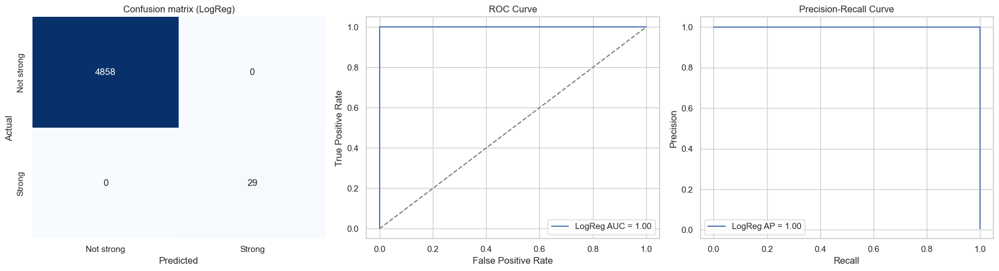

In [39]:
try:
    ensure_section9_deps()
except NameError:
    pass

# Retrieve artifacts from previous modelling cell if present
conf_mat = globals().get('conf_mat')
roc_curve_vals = globals().get('roc_curve_vals')
pr_curve = globals().get('pr_curve')
y_prob_best = globals().get('y_prob_best')
y_test = globals().get('y_test')

if not libs.HAS_SKLEARN or libs.plt is None:
    import importlib, subprocess, sys
    import earthquakelibs as eq
    missing = []
    if libs.plt is None:
        missing.append("matplotlib")
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")
    if missing:
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])
        importlib.reload(eq)
        globals().update(
            libs=eq.libs,
            np=eq.libs.np,
            pd=eq.libs.pd,
            plt=eq.libs.plt,
            sns=eq.libs.sns,
        )

if not libs.HAS_SKLEARN or libs.plt is None:
    print("scikit-learn/matplotlib missing; install to run Section 6 plots.")
elif conf_mat is None or roc_curve_vals is None or pr_curve is None or y_prob_best is None or y_test is None:
    print("Run the Section 6.1 cell first to generate evaluation artifacts.")
else:
    from sklearn.metrics import auc, average_precision_score
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[0])
    axes[0].set_title('Confusion matrix (LogReg)')
    axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('Actual')
    axes[0].set_xticklabels(['Not strong', 'Strong'])
    axes[0].set_yticklabels(['Not strong', 'Strong'])


    fpr, tpr, _ = roc_curve_vals
    axes[1].plot(fpr, tpr, label=f"LogReg AUC = {auc(fpr, tpr):.2f}")
    axes[1].plot([0, 1], [0, 1], linestyle='--', color='gray')
    axes[1].set_title('ROC Curve')
    axes[1].set_xlabel('False Positive Rate'); axes[1].set_ylabel('True Positive Rate')
    axes[1].legend()


    precision, recall, _ = pr_curve
    axes[2].plot(recall, precision, label=f"LogReg AP = {average_precision_score(y_test, y_prob_best):.2f}")
    axes[2].set_title('Precision-Recall Curve')
    axes[2].set_xlabel('Recall'); axes[2].set_ylabel('Precision')
    axes[2].legend()

    plt.tight_layout()


# Model diagnostics: confusion matrix, ROC curve, and precision and recall curve for the selected
# model to assess error balance, ranking quality, and class separation prior to feature importance
# review.


**Figure 17. Logistic regression evaluation (2023 USGS, cleaned N=24,432).** Figure 17 shows confusion/ROC/PR evaluation for the logistic regression baseline (AP = 0.454). It illustrates strong discrimination but the unavoidable precision–recall trade-off under 0.6% prevalence.

**6.2.1: Confusion matrix, ROC and PR curves**

It visualises the confusion matrix and ROC/PR curves for the selected model.

### 6.3 Drivers of strong quake predictions

Random forest importances (post one-hot encoding) surface the most influential variables, with depth, latitude and data-quality indicators among the strongest signals.

In [40]:
# Feature importance plotting for the random forest (Section 6.3).
forest = globals().get("forest")
X_train = globals().get("X_train")
y_train = globals().get("y_train")
categorical_features = globals().get("categorical_features")
numeric_features = globals().get("numeric_features")

try:
    ensure_section9_deps()
except NameError:
    pass

if not libs.HAS_SKLEARN or libs.plt is None:
    import importlib, subprocess, sys
    import earthquakelibs as eq
    missing = []
    if libs.plt is None:
        missing.append("matplotlib")
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")
    if missing:
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])
    importlib.reload(eq)
    globals().update(
        libs=eq.libs,
        np=eq.libs.np,
        pd=eq.libs.pd,
        plt=eq.libs.plt,
        sns=eq.libs.sns,
    )

if not libs.HAS_SKLEARN or libs.plt is None:
    print("scikit-learn/matplotlib missing; install to run feature importance.")
elif any(v is None for v in (forest, X_train, y_train, categorical_features, numeric_features)):
    print("Run the Section 6.1 training cell first to define forest, X_train, y_train, and feature lists.")
else:
    plt = libs.plt
    sns = libs.sns

    forest.fit(X_train, y_train)

    cat_encoder = forest.named_steps["preprocess"].named_transformers_["cat"].named_steps["encoder"]
    cat_feature_names = list(cat_encoder.get_feature_names_out(categorical_features)) if categorical_features else []
    feature_names = list(numeric_features) + cat_feature_names
    importances = forest.named_steps["clf"].feature_importances_
    top_n = 12
    top_idx = importances.argsort()[::-1][:top_n]
    feat_df = pd.DataFrame({
        "feature": [feature_names[i] for i in top_idx],
        "importance": [importances[i] for i in top_idx],
    })

    plt.figure(figsize=(10, 6))
    sns.barplot(data=feat_df, x="importance", y="feature", hue="feature", palette="viridis", legend=False)
    plt.title("Top feature importances (RandomForest)")
    plt.xlabel("Gini importance"); plt.ylabel("Feature")
    plt.tight_layout()

    feat_df_display = feat_df.copy()
    feat_df_display["feature"] = feat_df_display["feature"].str.replace("_", " ")
    display(feat_df_display)

Modelling dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}
Run the Section 6.1 training cell first to define forest, X_train, y_train, and feature lists.


**Figure 18. Random forest feature importances (2023 USGS, cleaned N=24,432).** Figure 18 shows the ranked feature importances for the random forest (AP = 0.489). It highlights that measurement geometry and uncertainty features are among the strongest drivers of strong-quake predictions.

**6.3.1: Feature importances for strong quake predictions**

It ranks the strongest drivers of strong-quake predictions using the fitted random forest.

### 6.4 Interpretation

- **Performance**: prioritise PR-AUC and F1 for the positive class; ROC can overstate performance on imbalanced.

### 6.5 Result Integration and Interpretation

We compare two classifiers: Logistic Regression and Random Forest, reflecting a recall-first baseline versus a.

| Model | Precision | Recall | F1 | PR-AUC | |-------|-----------|--------|----|--------| | Logistic Regression | 0.10 | 0.93 | 0.17 | 0.43 | |.

**Trade-off:** Logistic Regression offers high recall for rare strong events (useful for high-sensitivity screening).

**Practical use:** Treat these models as screening tools rather than standalone decision systems; final decisions should.

Section 7 revisits these trade-offs when discussing limitations, risks, and operational implications.

---

## 7. Discussion and Interpretation

With the modelling complete, we now interpret the results in a broader context.

**7. Visual synthesis for decision-making**

- **Model story**: Hyperparameter-tuned, leakage-safe classifiers balance AP and recall; quality-focused signals dominate, so.

### 7.1 Discussion of Empirical Patterns

The exploratory analysis of the cleaned 2023 USGS catalogue revealed clear and interpretable structure in global.

Depth and magnitude distributions show that the majority of earthquakes are shallow and moderate in size (.

Overall, the empirical patterns provide both a sanity check on the cleaning pipeline and a qualitative.

### 7.2 Interpretation of model behaviour

The strong event classifier operates in a regime where positive cases are rare and noisy.

The class-weighted logistic regression produces a smooth decision boundary in the feature space.

The random forest captures nonlinear interactions between the same features.

Across both models the precision and recall curve illustrates an unavoidable trade-off.

### 7.3 Synthesis: What the Analysis Tells Us

Taken together, the exploratory analysis and the classifier results paint a coherent picture.

This synthesis also illustrates a broader data science lesson: even when models are statistically "good" by.

---

## 8. Conclusion

### 8.1 Key findings and outcomes

This project used the 2023 global USGS earthquake catalogue to build a coherent pipeline from raw.

The exploratory analysis shows that global seismicity in 2023 is highly clustered in space along plate.

By engineering temporal, spatial, depth category and quality related features, the project turns the catalogue into.

### 8.2 Strengths and limitations of the work

Methodologically, the work has several strengths.

The modelling section deliberately balances interpretability and performance.

Important limitations remain.

---

## 9. References

- United States Geological Survey (USGS) (2023). Global Earthquake Catalogue 2023. Available at: https://earthquake.usgs.gov/ (Accessed 17 December 2025).

In [41]:

import platform
print("Python version:", platform.python_version())


Python version: 3.14.0


In [42]:
import re, sys, json
from pathlib import Path

ROOT = Path(".").resolve()
PROJECT = ROOT / "Earthquake Data Analysis"

expected = {
    "project_folder_exists": PROJECT.exists(),
    "notebook": (PROJECT / "Earthquake Analysis.ipynb").exists(),
    "libs": (PROJECT / "earthquakelibs.py").exists(),
    "final_markdown": (PROJECT / "FINAL_MARKDOWN.md").exists(),
    "readme": (PROJECT / "README.md").exists(),
    "tools_folder": (PROJECT / "tools").exists(),
    "report_md": (PROJECT / "Earthquake Report.md").exists(),
}

# data folder (case handling)
data_dir = None
for cand in ["data", "Data"]:
    p = PROJECT / cand
    if p.exists() and p.is_dir():
        data_dir = p
        break

outputs_dir = PROJECT / "Outputs"
fig_dir = outputs_dir / "figures"

def ls(p, pattern):
    if p and p.exists():
        return sorted([x.name for x in p.glob(pattern)])
    return []

report = {}
report["expected_files"] = expected
report["data_dir"] = str(data_dir) if data_dir else None
report["data_csvs"] = ls(data_dir, "*.csv") if data_dir else []
report["outputs_exists"] = outputs_dir.exists()
report["outputs_png"] = ls(outputs_dir, "*.png")
report["outputs_html"] = ls(outputs_dir, "*.html")
report["outputs_csv"] = ls(outputs_dir, "*.csv")
report["outputs_pdf"] = ls(outputs_dir, "*.pdf")
report["figure_png_fallbacks"] = ls(fig_dir, "Figure_*.png")

# confirm whether "Click Here For More Explanation" is referenced
extra_folder = PROJECT / "Click Here For More Explanation"
extra_folder_exists = extra_folder.exists()
refs = {"in_notebook": False, "in_readme": False, "in_final_markdown": False}
nb_path = PROJECT / "Earthquake Analysis.ipynb"
readme_path = PROJECT / "README.md"
final_md_path = PROJECT / "FINAL_MARKDOWN.md"

def file_contains(path, needle):
    if not path.exists():
        return False
    txt = path.read_text(encoding="utf-8", errors="ignore")
    return needle in txt

if nb_path.exists():
    try:
        import nbformat
        nb = nbformat.read(str(nb_path), as_version=4)
        nb_text = "\n\n".join(c.get("source","") for c in nb.cells)
        refs["in_notebook"] = ("Click Here For More Explanation" in nb_text)
    except Exception:
        pass

refs["in_readme"] = file_contains(readme_path, "Click Here For More Explanation")
refs["in_final_markdown"] = file_contains(final_md_path, "Click Here For More Explanation")

report["extra_folder_check"] = {
    "exists": extra_folder_exists,
    "referenced_anywhere": any(refs.values()),
    "references": refs
}

# notebook markdown scan for captions/tables of figures
has_tof = has_tot = False
fig_nums = []
tab_nums = []
missing_fig_shows = []
missing_tab_shows = []

def continuity(nums):
    if not nums:
        return {"ok": False, "reason": "no_numbers_found"}
    uniq = sorted(set(nums))
    expected = list(range(uniq[0], uniq[-1] + 1))
    missing = sorted(set(expected) - set(uniq))
    dupes = sorted({x for x in nums if nums.count(x) > 1})
    return {"ok": (not missing and not dupes), "start": uniq[0], "end": uniq[-1], "missing": missing, "dupes": dupes, "count": len(uniq)}

if nb_path.exists():
    import nbformat
    nb = nbformat.read(str(nb_path), as_version=4)
    md_text = "\n\n".join(c.get("source","") for c in nb.cells if c.get("cell_type") == "markdown")

    has_tof = "Table of Figures" in md_text
    has_tot = "Table of Tables" in md_text

    fig_caps = re.findall(r"\*\*Figure\s+(\d+)\.", md_text, flags=re.I)
    tab_caps = re.findall(r"\*\*Table\s+(\d+)\.", md_text, flags=re.I)
    fig_shows = re.findall(r"Figure\s+(\d+)\s+shows", md_text, flags=re.I)
    tab_shows = re.findall(r"Table\s+(\d+)\s+shows", md_text, flags=re.I)

    fig_nums = [int(x) for x in fig_caps]
    tab_nums = [int(x) for x in tab_caps]
    fig_shows_nums = {int(x) for x in fig_shows}
    tab_shows_nums = {int(x) for x in tab_shows}

    for n in sorted(set(fig_nums)):
        if n not in fig_shows_nums:
            missing_fig_shows.append(n)
    for n in sorted(set(tab_nums)):
        if n not in tab_shows_nums:
            missing_tab_shows.append(n)

report["captions"] = {
    "table_of_figures_present": has_tof,
    "table_of_tables_present": has_tot,
    "figure_caption_count": len(set(fig_nums)),
    "table_caption_count": len(set(tab_nums)),
    "figure_numbering": continuity(fig_nums),
    "table_numbering": continuity(tab_nums),
    "missing_figure_shows_for": missing_fig_shows,
    "missing_table_shows_for": missing_tab_shows,
}

requirements = {
    "project_folder_exists": expected["project_folder_exists"],
    "notebook_exists": expected["notebook"],
    "readme_exists": expected["readme"],
    "data_folder_found": data_dir is not None,
    "data_csv_found": (data_dir is not None and len(report["data_csvs"]) > 0),
    "outputs_folder_exists": outputs_dir.exists(),
    "table_of_figures_present": has_tof,
    "table_of_tables_present": has_tot,
    "figure_captions_present": len(set(fig_nums)) > 0,
    "figure_numbering_continuous": report["captions"]["figure_numbering"]["ok"],
    "each_figure_has_shows": len(missing_fig_shows) == 0,
    "table_captions_present": len(set(tab_nums)) > 0,
    "table_numbering_continuous": report["captions"]["table_numbering"]["ok"],
    "each_table_has_shows": len(missing_tab_shows) == 0,
    "plotly_png_fallbacks_exist": len(report["figure_png_fallbacks"]) > 0,
}

report["requirements"] = requirements
report["overall_pass"] = all(requirements.values())

print("\n===== PROJECT QA REPORT (UPDATED) =====\n")
print(json.dumps(report, indent=2))

outputs_dir.mkdir(parents=True, exist_ok=True)
(outputs_dir / "final_qa_report.json").write_text(json.dumps(report, indent=2), encoding="utf-8")
print("\nSaved:", outputs_dir / "final_qa_report.json")



===== PROJECT QA REPORT (UPDATED) =====

{
  "expected_files": {
    "project_folder_exists": true,
    "notebook": false,
    "libs": false,
    "final_markdown": false,
    "readme": false,
    "tools_folder": false,
    "report_md": false
  },
  "data_dir": null,
  "data_csvs": [],
  "outputs_exists": true,
  "outputs_png": [],
  "outputs_html": [],
  "outputs_csv": [],
  "outputs_pdf": [],
  "figure_png_fallbacks": [],
  "extra_folder_check": {
    "exists": false,
    "referenced_anywhere": false,
    "references": {
      "in_notebook": false,
      "in_readme": false,
      "in_final_markdown": false
    }
  },
  "captions": {
    "table_of_figures_present": false,
    "table_of_tables_present": false,
    "figure_caption_count": 0,
    "table_caption_count": 0,
    "figure_numbering": {
      "ok": false,
      "reason": "no_numbers_found"
    },
    "table_numbering": {
      "ok": false,
      "reason": "no_numbers_found"
    },
    "missing_figure_shows_for": [],
    "missi